# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeba_small/celeba/161988.jpg  
  inflating: processed_celeba_small/celeb

  inflating: processed_celeba_small/celeba/162381.jpg  
  inflating: processed_celeba_small/celeba/162382.jpg  
  inflating: processed_celeba_small/celeba/162383.jpg  
  inflating: processed_celeba_small/celeba/162384.jpg  
  inflating: processed_celeba_small/celeba/162385.jpg  
  inflating: processed_celeba_small/celeba/162386.jpg  
  inflating: processed_celeba_small/celeba/162387.jpg  
  inflating: processed_celeba_small/celeba/162388.jpg  
  inflating: processed_celeba_small/celeba/162389.jpg  
  inflating: processed_celeba_small/celeba/162390.jpg  
  inflating: processed_celeba_small/celeba/162391.jpg  
  inflating: processed_celeba_small/celeba/162392.jpg  
  inflating: processed_celeba_small/celeba/162393.jpg  
  inflating: processed_celeba_small/celeba/162394.jpg  
  inflating: processed_celeba_small/celeba/162395.jpg  
  inflating: processed_celeba_small/celeba/162396.jpg  
  inflating: processed_celeba_small/celeba/162397.jpg  
  inflating: processed_celeba_small/celeba/16239

  inflating: processed_celeba_small/celeba/162883.jpg  
  inflating: processed_celeba_small/celeba/162884.jpg  
  inflating: processed_celeba_small/celeba/162885.jpg  
  inflating: processed_celeba_small/celeba/162886.jpg  
  inflating: processed_celeba_small/celeba/162887.jpg  
  inflating: processed_celeba_small/celeba/162888.jpg  
  inflating: processed_celeba_small/celeba/162889.jpg  
  inflating: processed_celeba_small/celeba/162890.jpg  
  inflating: processed_celeba_small/celeba/162891.jpg  
  inflating: processed_celeba_small/celeba/162892.jpg  
  inflating: processed_celeba_small/celeba/162893.jpg  
  inflating: processed_celeba_small/celeba/162894.jpg  
  inflating: processed_celeba_small/celeba/162895.jpg  
  inflating: processed_celeba_small/celeba/162896.jpg  
  inflating: processed_celeba_small/celeba/162897.jpg  
  inflating: processed_celeba_small/celeba/162898.jpg  
  inflating: processed_celeba_small/celeba/162899.jpg  
  inflating: processed_celeba_small/celeba/16290

  inflating: processed_celeba_small/celeba/163156.jpg  
  inflating: processed_celeba_small/celeba/163157.jpg  
  inflating: processed_celeba_small/celeba/163158.jpg  
  inflating: processed_celeba_small/celeba/163159.jpg  
  inflating: processed_celeba_small/celeba/163160.jpg  
  inflating: processed_celeba_small/celeba/163161.jpg  
  inflating: processed_celeba_small/celeba/163162.jpg  
  inflating: processed_celeba_small/celeba/163163.jpg  
  inflating: processed_celeba_small/celeba/163164.jpg  
  inflating: processed_celeba_small/celeba/163165.jpg  
  inflating: processed_celeba_small/celeba/163166.jpg  
  inflating: processed_celeba_small/celeba/163167.jpg  
  inflating: processed_celeba_small/celeba/163168.jpg  
  inflating: processed_celeba_small/celeba/163169.jpg  
  inflating: processed_celeba_small/celeba/163170.jpg  
  inflating: processed_celeba_small/celeba/163171.jpg  
  inflating: processed_celeba_small/celeba/163172.jpg  
  inflating: processed_celeba_small/celeba/16317

  inflating: processed_celeba_small/celeba/163715.jpg  
  inflating: processed_celeba_small/celeba/163716.jpg  
  inflating: processed_celeba_small/celeba/163717.jpg  
  inflating: processed_celeba_small/celeba/163718.jpg  
  inflating: processed_celeba_small/celeba/163719.jpg  
  inflating: processed_celeba_small/celeba/163720.jpg  
  inflating: processed_celeba_small/celeba/163721.jpg  
  inflating: processed_celeba_small/celeba/163722.jpg  
  inflating: processed_celeba_small/celeba/163723.jpg  
  inflating: processed_celeba_small/celeba/163724.jpg  
  inflating: processed_celeba_small/celeba/163725.jpg  
  inflating: processed_celeba_small/celeba/163726.jpg  
  inflating: processed_celeba_small/celeba/163727.jpg  
  inflating: processed_celeba_small/celeba/163728.jpg  
  inflating: processed_celeba_small/celeba/163729.jpg  
  inflating: processed_celeba_small/celeba/163730.jpg  
  inflating: processed_celeba_small/celeba/163731.jpg  
  inflating: processed_celeba_small/celeba/16373

  inflating: processed_celeba_small/celeba/164080.jpg  
  inflating: processed_celeba_small/celeba/164081.jpg  
  inflating: processed_celeba_small/celeba/164082.jpg  
  inflating: processed_celeba_small/celeba/164083.jpg  
  inflating: processed_celeba_small/celeba/164084.jpg  
  inflating: processed_celeba_small/celeba/164085.jpg  
  inflating: processed_celeba_small/celeba/164086.jpg  
  inflating: processed_celeba_small/celeba/164087.jpg  
  inflating: processed_celeba_small/celeba/164088.jpg  
  inflating: processed_celeba_small/celeba/164089.jpg  
  inflating: processed_celeba_small/celeba/164090.jpg  
  inflating: processed_celeba_small/celeba/164091.jpg  
  inflating: processed_celeba_small/celeba/164092.jpg  
  inflating: processed_celeba_small/celeba/164093.jpg  
  inflating: processed_celeba_small/celeba/164094.jpg  
  inflating: processed_celeba_small/celeba/164095.jpg  
  inflating: processed_celeba_small/celeba/164096.jpg  
  inflating: processed_celeba_small/celeba/16409

  inflating: processed_celeba_small/celeba/164638.jpg  
  inflating: processed_celeba_small/celeba/164639.jpg  
  inflating: processed_celeba_small/celeba/164640.jpg  
  inflating: processed_celeba_small/celeba/164641.jpg  
  inflating: processed_celeba_small/celeba/164642.jpg  
  inflating: processed_celeba_small/celeba/164643.jpg  
  inflating: processed_celeba_small/celeba/164644.jpg  
  inflating: processed_celeba_small/celeba/164645.jpg  
  inflating: processed_celeba_small/celeba/164646.jpg  
  inflating: processed_celeba_small/celeba/164647.jpg  
  inflating: processed_celeba_small/celeba/164648.jpg  
  inflating: processed_celeba_small/celeba/164649.jpg  
  inflating: processed_celeba_small/celeba/164650.jpg  
  inflating: processed_celeba_small/celeba/164651.jpg  
  inflating: processed_celeba_small/celeba/164652.jpg  
  inflating: processed_celeba_small/celeba/164653.jpg  
  inflating: processed_celeba_small/celeba/164654.jpg  
  inflating: processed_celeba_small/celeba/16465

  inflating: processed_celeba_small/celeba/164983.jpg  
  inflating: processed_celeba_small/celeba/164984.jpg  
  inflating: processed_celeba_small/celeba/164985.jpg  
  inflating: processed_celeba_small/celeba/164986.jpg  
  inflating: processed_celeba_small/celeba/164987.jpg  
  inflating: processed_celeba_small/celeba/164988.jpg  
  inflating: processed_celeba_small/celeba/164989.jpg  
  inflating: processed_celeba_small/celeba/164990.jpg  
  inflating: processed_celeba_small/celeba/164991.jpg  
  inflating: processed_celeba_small/celeba/164992.jpg  
  inflating: processed_celeba_small/celeba/164993.jpg  
  inflating: processed_celeba_small/celeba/164994.jpg  
  inflating: processed_celeba_small/celeba/164995.jpg  
  inflating: processed_celeba_small/celeba/164996.jpg  
  inflating: processed_celeba_small/celeba/164997.jpg  
  inflating: processed_celeba_small/celeba/164998.jpg  
  inflating: processed_celeba_small/celeba/164999.jpg  
  inflating: processed_celeba_small/celeba/16500

  inflating: processed_celeba_small/celeba/165532.jpg  
  inflating: processed_celeba_small/celeba/165533.jpg  
  inflating: processed_celeba_small/celeba/165534.jpg  
  inflating: processed_celeba_small/celeba/165535.jpg  
  inflating: processed_celeba_small/celeba/165536.jpg  
  inflating: processed_celeba_small/celeba/165537.jpg  
  inflating: processed_celeba_small/celeba/165538.jpg  
  inflating: processed_celeba_small/celeba/165539.jpg  
  inflating: processed_celeba_small/celeba/165540.jpg  
  inflating: processed_celeba_small/celeba/165541.jpg  
  inflating: processed_celeba_small/celeba/165542.jpg  
  inflating: processed_celeba_small/celeba/165543.jpg  
  inflating: processed_celeba_small/celeba/165544.jpg  
  inflating: processed_celeba_small/celeba/165545.jpg  
  inflating: processed_celeba_small/celeba/165546.jpg  
  inflating: processed_celeba_small/celeba/165547.jpg  
  inflating: processed_celeba_small/celeba/165548.jpg  
  inflating: processed_celeba_small/celeba/16554

  inflating: processed_celeba_small/celeba/165850.jpg  
  inflating: processed_celeba_small/celeba/165851.jpg  
  inflating: processed_celeba_small/celeba/165852.jpg  
  inflating: processed_celeba_small/celeba/165853.jpg  
  inflating: processed_celeba_small/celeba/165854.jpg  
  inflating: processed_celeba_small/celeba/165855.jpg  
  inflating: processed_celeba_small/celeba/165856.jpg  
  inflating: processed_celeba_small/celeba/165857.jpg  
  inflating: processed_celeba_small/celeba/165858.jpg  
  inflating: processed_celeba_small/celeba/165859.jpg  
  inflating: processed_celeba_small/celeba/165860.jpg  
  inflating: processed_celeba_small/celeba/165861.jpg  
  inflating: processed_celeba_small/celeba/165862.jpg  
  inflating: processed_celeba_small/celeba/165863.jpg  
  inflating: processed_celeba_small/celeba/165864.jpg  
  inflating: processed_celeba_small/celeba/165865.jpg  
  inflating: processed_celeba_small/celeba/165866.jpg  
  inflating: processed_celeba_small/celeba/16586

  inflating: processed_celeba_small/celeba/166398.jpg  
  inflating: processed_celeba_small/celeba/166399.jpg  
  inflating: processed_celeba_small/celeba/166400.jpg  
  inflating: processed_celeba_small/celeba/166401.jpg  
  inflating: processed_celeba_small/celeba/166402.jpg  
  inflating: processed_celeba_small/celeba/166403.jpg  
  inflating: processed_celeba_small/celeba/166404.jpg  
  inflating: processed_celeba_small/celeba/166405.jpg  
  inflating: processed_celeba_small/celeba/166406.jpg  
  inflating: processed_celeba_small/celeba/166407.jpg  
  inflating: processed_celeba_small/celeba/166408.jpg  
  inflating: processed_celeba_small/celeba/166409.jpg  
  inflating: processed_celeba_small/celeba/166410.jpg  
  inflating: processed_celeba_small/celeba/166411.jpg  
  inflating: processed_celeba_small/celeba/166412.jpg  
  inflating: processed_celeba_small/celeba/166413.jpg  
  inflating: processed_celeba_small/celeba/166414.jpg  
  inflating: processed_celeba_small/celeba/16641

  inflating: processed_celeba_small/celeba/166756.jpg  
  inflating: processed_celeba_small/celeba/166757.jpg  
  inflating: processed_celeba_small/celeba/166758.jpg  
  inflating: processed_celeba_small/celeba/166759.jpg  
  inflating: processed_celeba_small/celeba/166760.jpg  
  inflating: processed_celeba_small/celeba/166761.jpg  
  inflating: processed_celeba_small/celeba/166762.jpg  
  inflating: processed_celeba_small/celeba/166763.jpg  
  inflating: processed_celeba_small/celeba/166764.jpg  
  inflating: processed_celeba_small/celeba/166765.jpg  
  inflating: processed_celeba_small/celeba/166766.jpg  
  inflating: processed_celeba_small/celeba/166767.jpg  
  inflating: processed_celeba_small/celeba/166768.jpg  
  inflating: processed_celeba_small/celeba/166769.jpg  
  inflating: processed_celeba_small/celeba/166770.jpg  
  inflating: processed_celeba_small/celeba/166771.jpg  
  inflating: processed_celeba_small/celeba/166772.jpg  
  inflating: processed_celeba_small/celeba/16677

  inflating: processed_celeba_small/celeba/167319.jpg  
  inflating: processed_celeba_small/celeba/167320.jpg  
  inflating: processed_celeba_small/celeba/167321.jpg  
  inflating: processed_celeba_small/celeba/167322.jpg  
  inflating: processed_celeba_small/celeba/167323.jpg  
  inflating: processed_celeba_small/celeba/167324.jpg  
  inflating: processed_celeba_small/celeba/167325.jpg  
  inflating: processed_celeba_small/celeba/167326.jpg  
  inflating: processed_celeba_small/celeba/167327.jpg  
  inflating: processed_celeba_small/celeba/167328.jpg  
  inflating: processed_celeba_small/celeba/167329.jpg  
  inflating: processed_celeba_small/celeba/167330.jpg  
  inflating: processed_celeba_small/celeba/167331.jpg  
  inflating: processed_celeba_small/celeba/167332.jpg  
  inflating: processed_celeba_small/celeba/167333.jpg  
  inflating: processed_celeba_small/celeba/167334.jpg  
  inflating: processed_celeba_small/celeba/167335.jpg  
  inflating: processed_celeba_small/celeba/16733

  inflating: processed_celeba_small/celeba/167652.jpg  
  inflating: processed_celeba_small/celeba/167653.jpg  
  inflating: processed_celeba_small/celeba/167654.jpg  
  inflating: processed_celeba_small/celeba/167655.jpg  
  inflating: processed_celeba_small/celeba/167656.jpg  
  inflating: processed_celeba_small/celeba/167657.jpg  
  inflating: processed_celeba_small/celeba/167658.jpg  
  inflating: processed_celeba_small/celeba/167659.jpg  
  inflating: processed_celeba_small/celeba/167660.jpg  
  inflating: processed_celeba_small/celeba/167661.jpg  
  inflating: processed_celeba_small/celeba/167662.jpg  
  inflating: processed_celeba_small/celeba/167663.jpg  
  inflating: processed_celeba_small/celeba/167664.jpg  
  inflating: processed_celeba_small/celeba/167665.jpg  
  inflating: processed_celeba_small/celeba/167666.jpg  
  inflating: processed_celeba_small/celeba/167667.jpg  
  inflating: processed_celeba_small/celeba/167668.jpg  
  inflating: processed_celeba_small/celeba/16766

  inflating: processed_celeba_small/celeba/168203.jpg  
  inflating: processed_celeba_small/celeba/168204.jpg  
  inflating: processed_celeba_small/celeba/168205.jpg  
  inflating: processed_celeba_small/celeba/168206.jpg  
  inflating: processed_celeba_small/celeba/168207.jpg  
  inflating: processed_celeba_small/celeba/168208.jpg  
  inflating: processed_celeba_small/celeba/168209.jpg  
  inflating: processed_celeba_small/celeba/168210.jpg  
  inflating: processed_celeba_small/celeba/168211.jpg  
  inflating: processed_celeba_small/celeba/168212.jpg  
  inflating: processed_celeba_small/celeba/168213.jpg  
  inflating: processed_celeba_small/celeba/168214.jpg  
  inflating: processed_celeba_small/celeba/168215.jpg  
  inflating: processed_celeba_small/celeba/168216.jpg  
  inflating: processed_celeba_small/celeba/168217.jpg  
  inflating: processed_celeba_small/celeba/168218.jpg  
  inflating: processed_celeba_small/celeba/168219.jpg  
  inflating: processed_celeba_small/celeba/16822

  inflating: processed_celeba_small/celeba/168544.jpg  
  inflating: processed_celeba_small/celeba/168545.jpg  
  inflating: processed_celeba_small/celeba/168546.jpg  
  inflating: processed_celeba_small/celeba/168547.jpg  
  inflating: processed_celeba_small/celeba/168548.jpg  
  inflating: processed_celeba_small/celeba/168549.jpg  
  inflating: processed_celeba_small/celeba/168550.jpg  
  inflating: processed_celeba_small/celeba/168551.jpg  
  inflating: processed_celeba_small/celeba/168552.jpg  
  inflating: processed_celeba_small/celeba/168553.jpg  
  inflating: processed_celeba_small/celeba/168554.jpg  
  inflating: processed_celeba_small/celeba/168555.jpg  
  inflating: processed_celeba_small/celeba/168556.jpg  
  inflating: processed_celeba_small/celeba/168557.jpg  
  inflating: processed_celeba_small/celeba/168558.jpg  
  inflating: processed_celeba_small/celeba/168559.jpg  
  inflating: processed_celeba_small/celeba/168560.jpg  
  inflating: processed_celeba_small/celeba/16856

  inflating: processed_celeba_small/celeba/169084.jpg  
  inflating: processed_celeba_small/celeba/169085.jpg  
  inflating: processed_celeba_small/celeba/169086.jpg  
  inflating: processed_celeba_small/celeba/169087.jpg  
  inflating: processed_celeba_small/celeba/169088.jpg  
  inflating: processed_celeba_small/celeba/169089.jpg  
  inflating: processed_celeba_small/celeba/169090.jpg  
  inflating: processed_celeba_small/celeba/169091.jpg  
  inflating: processed_celeba_small/celeba/169092.jpg  
  inflating: processed_celeba_small/celeba/169093.jpg  
  inflating: processed_celeba_small/celeba/169094.jpg  
  inflating: processed_celeba_small/celeba/169095.jpg  
  inflating: processed_celeba_small/celeba/169096.jpg  
  inflating: processed_celeba_small/celeba/169097.jpg  
  inflating: processed_celeba_small/celeba/169098.jpg  
  inflating: processed_celeba_small/celeba/169099.jpg  
  inflating: processed_celeba_small/celeba/169100.jpg  
  inflating: processed_celeba_small/celeba/16910

  inflating: processed_celeba_small/celeba/169414.jpg  
  inflating: processed_celeba_small/celeba/169415.jpg  
  inflating: processed_celeba_small/celeba/169416.jpg  
  inflating: processed_celeba_small/celeba/169417.jpg  
  inflating: processed_celeba_small/celeba/169418.jpg  
  inflating: processed_celeba_small/celeba/169419.jpg  
  inflating: processed_celeba_small/celeba/169420.jpg  
  inflating: processed_celeba_small/celeba/169421.jpg  
  inflating: processed_celeba_small/celeba/169422.jpg  
  inflating: processed_celeba_small/celeba/169423.jpg  
  inflating: processed_celeba_small/celeba/169424.jpg  
  inflating: processed_celeba_small/celeba/169425.jpg  
  inflating: processed_celeba_small/celeba/169426.jpg  
  inflating: processed_celeba_small/celeba/169427.jpg  
  inflating: processed_celeba_small/celeba/169428.jpg  
  inflating: processed_celeba_small/celeba/169429.jpg  
  inflating: processed_celeba_small/celeba/169430.jpg  
  inflating: processed_celeba_small/celeba/16943

  inflating: processed_celeba_small/celeba/169959.jpg  
  inflating: processed_celeba_small/celeba/169960.jpg  
  inflating: processed_celeba_small/celeba/169961.jpg  
  inflating: processed_celeba_small/celeba/169962.jpg  
  inflating: processed_celeba_small/celeba/169963.jpg  
  inflating: processed_celeba_small/celeba/169964.jpg  
  inflating: processed_celeba_small/celeba/169965.jpg  
  inflating: processed_celeba_small/celeba/169966.jpg  
  inflating: processed_celeba_small/celeba/169967.jpg  
  inflating: processed_celeba_small/celeba/169968.jpg  
  inflating: processed_celeba_small/celeba/169969.jpg  
  inflating: processed_celeba_small/celeba/169970.jpg  
  inflating: processed_celeba_small/celeba/169971.jpg  
  inflating: processed_celeba_small/celeba/169972.jpg  
  inflating: processed_celeba_small/celeba/169973.jpg  
  inflating: processed_celeba_small/celeba/169974.jpg  
  inflating: processed_celeba_small/celeba/169975.jpg  
  inflating: processed_celeba_small/celeba/16997

  inflating: processed_celeba_small/celeba/170303.jpg  
  inflating: processed_celeba_small/celeba/170304.jpg  
  inflating: processed_celeba_small/celeba/170305.jpg  
  inflating: processed_celeba_small/celeba/170306.jpg  
  inflating: processed_celeba_small/celeba/170307.jpg  
  inflating: processed_celeba_small/celeba/170308.jpg  
  inflating: processed_celeba_small/celeba/170309.jpg  
  inflating: processed_celeba_small/celeba/170310.jpg  
  inflating: processed_celeba_small/celeba/170311.jpg  
  inflating: processed_celeba_small/celeba/170312.jpg  
  inflating: processed_celeba_small/celeba/170313.jpg  
  inflating: processed_celeba_small/celeba/170314.jpg  
  inflating: processed_celeba_small/celeba/170315.jpg  
  inflating: processed_celeba_small/celeba/170316.jpg  
  inflating: processed_celeba_small/celeba/170317.jpg  
  inflating: processed_celeba_small/celeba/170318.jpg  
  inflating: processed_celeba_small/celeba/170319.jpg  
  inflating: processed_celeba_small/celeba/17032

  inflating: processed_celeba_small/celeba/170872.jpg  
  inflating: processed_celeba_small/celeba/170873.jpg  
  inflating: processed_celeba_small/celeba/170874.jpg  
  inflating: processed_celeba_small/celeba/170875.jpg  
  inflating: processed_celeba_small/celeba/170876.jpg  
  inflating: processed_celeba_small/celeba/170877.jpg  
  inflating: processed_celeba_small/celeba/170878.jpg  
  inflating: processed_celeba_small/celeba/170879.jpg  
  inflating: processed_celeba_small/celeba/170880.jpg  
  inflating: processed_celeba_small/celeba/170881.jpg  
  inflating: processed_celeba_small/celeba/170882.jpg  
  inflating: processed_celeba_small/celeba/170883.jpg  
  inflating: processed_celeba_small/celeba/170884.jpg  
  inflating: processed_celeba_small/celeba/170885.jpg  
  inflating: processed_celeba_small/celeba/170886.jpg  
  inflating: processed_celeba_small/celeba/170887.jpg  
  inflating: processed_celeba_small/celeba/170888.jpg  
  inflating: processed_celeba_small/celeba/17088

  inflating: processed_celeba_small/celeba/171232.jpg  
  inflating: processed_celeba_small/celeba/171233.jpg  
  inflating: processed_celeba_small/celeba/171234.jpg  
  inflating: processed_celeba_small/celeba/171235.jpg  
  inflating: processed_celeba_small/celeba/171236.jpg  
  inflating: processed_celeba_small/celeba/171237.jpg  
  inflating: processed_celeba_small/celeba/171238.jpg  
  inflating: processed_celeba_small/celeba/171239.jpg  
  inflating: processed_celeba_small/celeba/171240.jpg  
  inflating: processed_celeba_small/celeba/171241.jpg  
  inflating: processed_celeba_small/celeba/171242.jpg  
  inflating: processed_celeba_small/celeba/171243.jpg  
  inflating: processed_celeba_small/celeba/171244.jpg  
  inflating: processed_celeba_small/celeba/171245.jpg  
  inflating: processed_celeba_small/celeba/171246.jpg  
  inflating: processed_celeba_small/celeba/171247.jpg  
  inflating: processed_celeba_small/celeba/171248.jpg  
  inflating: processed_celeba_small/celeba/17124

  inflating: processed_celeba_small/celeba/171784.jpg  
  inflating: processed_celeba_small/celeba/171785.jpg  
  inflating: processed_celeba_small/celeba/171786.jpg  
  inflating: processed_celeba_small/celeba/171787.jpg  
  inflating: processed_celeba_small/celeba/171788.jpg  
  inflating: processed_celeba_small/celeba/171789.jpg  
  inflating: processed_celeba_small/celeba/171790.jpg  
  inflating: processed_celeba_small/celeba/171791.jpg  
  inflating: processed_celeba_small/celeba/171792.jpg  
  inflating: processed_celeba_small/celeba/171793.jpg  
  inflating: processed_celeba_small/celeba/171794.jpg  
  inflating: processed_celeba_small/celeba/171795.jpg  
  inflating: processed_celeba_small/celeba/171796.jpg  
  inflating: processed_celeba_small/celeba/171797.jpg  
  inflating: processed_celeba_small/celeba/171798.jpg  
  inflating: processed_celeba_small/celeba/171799.jpg  
  inflating: processed_celeba_small/celeba/171800.jpg  
  inflating: processed_celeba_small/celeba/17180

  inflating: processed_celeba_small/celeba/172116.jpg  
  inflating: processed_celeba_small/celeba/172117.jpg  
  inflating: processed_celeba_small/celeba/172118.jpg  
  inflating: processed_celeba_small/celeba/172119.jpg  
  inflating: processed_celeba_small/celeba/172120.jpg  
  inflating: processed_celeba_small/celeba/172121.jpg  
  inflating: processed_celeba_small/celeba/172122.jpg  
  inflating: processed_celeba_small/celeba/172123.jpg  
  inflating: processed_celeba_small/celeba/172124.jpg  
  inflating: processed_celeba_small/celeba/172125.jpg  
  inflating: processed_celeba_small/celeba/172126.jpg  
  inflating: processed_celeba_small/celeba/172127.jpg  
  inflating: processed_celeba_small/celeba/172128.jpg  
  inflating: processed_celeba_small/celeba/172129.jpg  
  inflating: processed_celeba_small/celeba/172130.jpg  
  inflating: processed_celeba_small/celeba/172131.jpg  
  inflating: processed_celeba_small/celeba/172132.jpg  
  inflating: processed_celeba_small/celeba/17213

  inflating: processed_celeba_small/celeba/172684.jpg  
  inflating: processed_celeba_small/celeba/172685.jpg  
  inflating: processed_celeba_small/celeba/172686.jpg  
  inflating: processed_celeba_small/celeba/172687.jpg  
  inflating: processed_celeba_small/celeba/172688.jpg  
  inflating: processed_celeba_small/celeba/172689.jpg  
  inflating: processed_celeba_small/celeba/172690.jpg  
  inflating: processed_celeba_small/celeba/172691.jpg  
  inflating: processed_celeba_small/celeba/172692.jpg  
  inflating: processed_celeba_small/celeba/172693.jpg  
  inflating: processed_celeba_small/celeba/172694.jpg  
  inflating: processed_celeba_small/celeba/172695.jpg  
  inflating: processed_celeba_small/celeba/172696.jpg  
  inflating: processed_celeba_small/celeba/172697.jpg  
  inflating: processed_celeba_small/celeba/172698.jpg  
  inflating: processed_celeba_small/celeba/172699.jpg  
  inflating: processed_celeba_small/celeba/172700.jpg  
  inflating: processed_celeba_small/celeba/17270

  inflating: processed_celeba_small/celeba/173047.jpg  
  inflating: processed_celeba_small/celeba/173048.jpg  
  inflating: processed_celeba_small/celeba/173049.jpg  
  inflating: processed_celeba_small/celeba/173050.jpg  
  inflating: processed_celeba_small/celeba/173051.jpg  
  inflating: processed_celeba_small/celeba/173052.jpg  
  inflating: processed_celeba_small/celeba/173053.jpg  
  inflating: processed_celeba_small/celeba/173054.jpg  
  inflating: processed_celeba_small/celeba/173055.jpg  
  inflating: processed_celeba_small/celeba/173056.jpg  
  inflating: processed_celeba_small/celeba/173057.jpg  
  inflating: processed_celeba_small/celeba/173058.jpg  
  inflating: processed_celeba_small/celeba/173059.jpg  
  inflating: processed_celeba_small/celeba/173060.jpg  
  inflating: processed_celeba_small/celeba/173061.jpg  
  inflating: processed_celeba_small/celeba/173062.jpg  
  inflating: processed_celeba_small/celeba/173063.jpg  
  inflating: processed_celeba_small/celeba/17306

  inflating: processed_celeba_small/celeba/173611.jpg  
  inflating: processed_celeba_small/celeba/173612.jpg  
  inflating: processed_celeba_small/celeba/173613.jpg  
  inflating: processed_celeba_small/celeba/173614.jpg  
  inflating: processed_celeba_small/celeba/173615.jpg  
  inflating: processed_celeba_small/celeba/173616.jpg  
  inflating: processed_celeba_small/celeba/173617.jpg  
  inflating: processed_celeba_small/celeba/173618.jpg  
  inflating: processed_celeba_small/celeba/173619.jpg  
  inflating: processed_celeba_small/celeba/173620.jpg  
  inflating: processed_celeba_small/celeba/173621.jpg  
  inflating: processed_celeba_small/celeba/173622.jpg  
  inflating: processed_celeba_small/celeba/173623.jpg  
  inflating: processed_celeba_small/celeba/173624.jpg  
  inflating: processed_celeba_small/celeba/173625.jpg  
  inflating: processed_celeba_small/celeba/173626.jpg  
  inflating: processed_celeba_small/celeba/173627.jpg  
  inflating: processed_celeba_small/celeba/17362

  inflating: processed_celeba_small/celeba/173945.jpg  
  inflating: processed_celeba_small/celeba/173946.jpg  
  inflating: processed_celeba_small/celeba/173947.jpg  
  inflating: processed_celeba_small/celeba/173948.jpg  
  inflating: processed_celeba_small/celeba/173949.jpg  
  inflating: processed_celeba_small/celeba/173950.jpg  
  inflating: processed_celeba_small/celeba/173951.jpg  
  inflating: processed_celeba_small/celeba/173952.jpg  
  inflating: processed_celeba_small/celeba/173953.jpg  
  inflating: processed_celeba_small/celeba/173954.jpg  
  inflating: processed_celeba_small/celeba/173955.jpg  
  inflating: processed_celeba_small/celeba/173956.jpg  
  inflating: processed_celeba_small/celeba/173957.jpg  
  inflating: processed_celeba_small/celeba/173958.jpg  
  inflating: processed_celeba_small/celeba/173959.jpg  
  inflating: processed_celeba_small/celeba/173960.jpg  
  inflating: processed_celeba_small/celeba/173961.jpg  
  inflating: processed_celeba_small/celeba/17396

  inflating: processed_celeba_small/celeba/174486.jpg  
  inflating: processed_celeba_small/celeba/174487.jpg  
  inflating: processed_celeba_small/celeba/174488.jpg  
  inflating: processed_celeba_small/celeba/174489.jpg  
  inflating: processed_celeba_small/celeba/174490.jpg  
  inflating: processed_celeba_small/celeba/174491.jpg  
  inflating: processed_celeba_small/celeba/174492.jpg  
  inflating: processed_celeba_small/celeba/174493.jpg  
  inflating: processed_celeba_small/celeba/174494.jpg  
  inflating: processed_celeba_small/celeba/174495.jpg  
  inflating: processed_celeba_small/celeba/174496.jpg  
  inflating: processed_celeba_small/celeba/174497.jpg  
  inflating: processed_celeba_small/celeba/174498.jpg  
  inflating: processed_celeba_small/celeba/174499.jpg  
  inflating: processed_celeba_small/celeba/174500.jpg  
  inflating: processed_celeba_small/celeba/174501.jpg  
  inflating: processed_celeba_small/celeba/174502.jpg  
  inflating: processed_celeba_small/celeba/17450

  inflating: processed_celeba_small/celeba/175047.jpg  
  inflating: processed_celeba_small/celeba/175048.jpg  
  inflating: processed_celeba_small/celeba/175049.jpg  
  inflating: processed_celeba_small/celeba/175050.jpg  
  inflating: processed_celeba_small/celeba/175051.jpg  
  inflating: processed_celeba_small/celeba/175052.jpg  
  inflating: processed_celeba_small/celeba/175053.jpg  
  inflating: processed_celeba_small/celeba/175054.jpg  
  inflating: processed_celeba_small/celeba/175055.jpg  
  inflating: processed_celeba_small/celeba/175056.jpg  
  inflating: processed_celeba_small/celeba/175057.jpg  
  inflating: processed_celeba_small/celeba/175058.jpg  
  inflating: processed_celeba_small/celeba/175059.jpg  
  inflating: processed_celeba_small/celeba/175060.jpg  
  inflating: processed_celeba_small/celeba/175061.jpg  
  inflating: processed_celeba_small/celeba/175062.jpg  
  inflating: processed_celeba_small/celeba/175063.jpg  
  inflating: processed_celeba_small/celeba/17506

  inflating: processed_celeba_small/celeba/175371.jpg  
  inflating: processed_celeba_small/celeba/175372.jpg  
  inflating: processed_celeba_small/celeba/175373.jpg  
  inflating: processed_celeba_small/celeba/175374.jpg  
  inflating: processed_celeba_small/celeba/175375.jpg  
  inflating: processed_celeba_small/celeba/175376.jpg  
  inflating: processed_celeba_small/celeba/175377.jpg  
  inflating: processed_celeba_small/celeba/175378.jpg  
  inflating: processed_celeba_small/celeba/175379.jpg  
  inflating: processed_celeba_small/celeba/175380.jpg  
  inflating: processed_celeba_small/celeba/175381.jpg  
  inflating: processed_celeba_small/celeba/175382.jpg  
  inflating: processed_celeba_small/celeba/175383.jpg  
  inflating: processed_celeba_small/celeba/175384.jpg  
  inflating: processed_celeba_small/celeba/175385.jpg  
  inflating: processed_celeba_small/celeba/175386.jpg  
  inflating: processed_celeba_small/celeba/175387.jpg  
  inflating: processed_celeba_small/celeba/17538

  inflating: processed_celeba_small/celeba/175904.jpg  
  inflating: processed_celeba_small/celeba/175905.jpg  
  inflating: processed_celeba_small/celeba/175906.jpg  
  inflating: processed_celeba_small/celeba/175907.jpg  
  inflating: processed_celeba_small/celeba/175908.jpg  
  inflating: processed_celeba_small/celeba/175909.jpg  
  inflating: processed_celeba_small/celeba/175910.jpg  
  inflating: processed_celeba_small/celeba/175911.jpg  
  inflating: processed_celeba_small/celeba/175912.jpg  
  inflating: processed_celeba_small/celeba/175913.jpg  
  inflating: processed_celeba_small/celeba/175914.jpg  
  inflating: processed_celeba_small/celeba/175915.jpg  
  inflating: processed_celeba_small/celeba/175916.jpg  
  inflating: processed_celeba_small/celeba/175917.jpg  
  inflating: processed_celeba_small/celeba/175918.jpg  
  inflating: processed_celeba_small/celeba/175919.jpg  
  inflating: processed_celeba_small/celeba/175920.jpg  
  inflating: processed_celeba_small/celeba/17592

  inflating: processed_celeba_small/celeba/176203.jpg  
  inflating: processed_celeba_small/celeba/176204.jpg  
  inflating: processed_celeba_small/celeba/176205.jpg  
  inflating: processed_celeba_small/celeba/176206.jpg  
  inflating: processed_celeba_small/celeba/176207.jpg  
  inflating: processed_celeba_small/celeba/176208.jpg  
  inflating: processed_celeba_small/celeba/176209.jpg  
  inflating: processed_celeba_small/celeba/176210.jpg  
  inflating: processed_celeba_small/celeba/176211.jpg  
  inflating: processed_celeba_small/celeba/176212.jpg  
  inflating: processed_celeba_small/celeba/176213.jpg  
  inflating: processed_celeba_small/celeba/176214.jpg  
  inflating: processed_celeba_small/celeba/176215.jpg  
  inflating: processed_celeba_small/celeba/176216.jpg  
  inflating: processed_celeba_small/celeba/176217.jpg  
  inflating: processed_celeba_small/celeba/176218.jpg  
  inflating: processed_celeba_small/celeba/176219.jpg  
  inflating: processed_celeba_small/celeba/17622

  inflating: processed_celeba_small/celeba/176728.jpg  
  inflating: processed_celeba_small/celeba/176729.jpg  
  inflating: processed_celeba_small/celeba/176730.jpg  
  inflating: processed_celeba_small/celeba/176731.jpg  
  inflating: processed_celeba_small/celeba/176732.jpg  
  inflating: processed_celeba_small/celeba/176733.jpg  
  inflating: processed_celeba_small/celeba/176734.jpg  
  inflating: processed_celeba_small/celeba/176735.jpg  
  inflating: processed_celeba_small/celeba/176736.jpg  
  inflating: processed_celeba_small/celeba/176737.jpg  
  inflating: processed_celeba_small/celeba/176738.jpg  
  inflating: processed_celeba_small/celeba/176739.jpg  
  inflating: processed_celeba_small/celeba/176740.jpg  
  inflating: processed_celeba_small/celeba/176741.jpg  
  inflating: processed_celeba_small/celeba/176742.jpg  
  inflating: processed_celeba_small/celeba/176743.jpg  
  inflating: processed_celeba_small/celeba/176744.jpg  
  inflating: processed_celeba_small/celeba/17674

  inflating: processed_celeba_small/celeba/177033.jpg  
  inflating: processed_celeba_small/celeba/177034.jpg  
  inflating: processed_celeba_small/celeba/177035.jpg  
  inflating: processed_celeba_small/celeba/177036.jpg  
  inflating: processed_celeba_small/celeba/177037.jpg  
  inflating: processed_celeba_small/celeba/177038.jpg  
  inflating: processed_celeba_small/celeba/177039.jpg  
  inflating: processed_celeba_small/celeba/177040.jpg  
  inflating: processed_celeba_small/celeba/177041.jpg  
  inflating: processed_celeba_small/celeba/177042.jpg  
  inflating: processed_celeba_small/celeba/177043.jpg  
  inflating: processed_celeba_small/celeba/177044.jpg  
  inflating: processed_celeba_small/celeba/177045.jpg  
  inflating: processed_celeba_small/celeba/177046.jpg  
  inflating: processed_celeba_small/celeba/177047.jpg  
  inflating: processed_celeba_small/celeba/177048.jpg  
  inflating: processed_celeba_small/celeba/177049.jpg  
  inflating: processed_celeba_small/celeba/17705

  inflating: processed_celeba_small/celeba/177579.jpg  
  inflating: processed_celeba_small/celeba/177580.jpg  
  inflating: processed_celeba_small/celeba/177581.jpg  
  inflating: processed_celeba_small/celeba/177582.jpg  
  inflating: processed_celeba_small/celeba/177583.jpg  
  inflating: processed_celeba_small/celeba/177584.jpg  
  inflating: processed_celeba_small/celeba/177585.jpg  
  inflating: processed_celeba_small/celeba/177586.jpg  
  inflating: processed_celeba_small/celeba/177587.jpg  
  inflating: processed_celeba_small/celeba/177588.jpg  
  inflating: processed_celeba_small/celeba/177589.jpg  
  inflating: processed_celeba_small/celeba/177590.jpg  
  inflating: processed_celeba_small/celeba/177591.jpg  
  inflating: processed_celeba_small/celeba/177592.jpg  
  inflating: processed_celeba_small/celeba/177593.jpg  
  inflating: processed_celeba_small/celeba/177594.jpg  
  inflating: processed_celeba_small/celeba/177595.jpg  
  inflating: processed_celeba_small/celeba/17759

  inflating: processed_celeba_small/celeba/177878.jpg  
  inflating: processed_celeba_small/celeba/177879.jpg  
  inflating: processed_celeba_small/celeba/177880.jpg  
  inflating: processed_celeba_small/celeba/177881.jpg  
  inflating: processed_celeba_small/celeba/177882.jpg  
  inflating: processed_celeba_small/celeba/177883.jpg  
  inflating: processed_celeba_small/celeba/177884.jpg  
  inflating: processed_celeba_small/celeba/177885.jpg  
  inflating: processed_celeba_small/celeba/177886.jpg  
  inflating: processed_celeba_small/celeba/177887.jpg  
  inflating: processed_celeba_small/celeba/177888.jpg  
  inflating: processed_celeba_small/celeba/177889.jpg  
  inflating: processed_celeba_small/celeba/177890.jpg  
  inflating: processed_celeba_small/celeba/177891.jpg  
  inflating: processed_celeba_small/celeba/177892.jpg  
  inflating: processed_celeba_small/celeba/177893.jpg  
  inflating: processed_celeba_small/celeba/177894.jpg  
  inflating: processed_celeba_small/celeba/17789

  inflating: processed_celeba_small/celeba/178375.jpg  
  inflating: processed_celeba_small/celeba/178376.jpg  
  inflating: processed_celeba_small/celeba/178377.jpg  
  inflating: processed_celeba_small/celeba/178378.jpg  
  inflating: processed_celeba_small/celeba/178379.jpg  
  inflating: processed_celeba_small/celeba/178380.jpg  
  inflating: processed_celeba_small/celeba/178381.jpg  
  inflating: processed_celeba_small/celeba/178382.jpg  
  inflating: processed_celeba_small/celeba/178383.jpg  
  inflating: processed_celeba_small/celeba/178384.jpg  
  inflating: processed_celeba_small/celeba/178385.jpg  
  inflating: processed_celeba_small/celeba/178386.jpg  
  inflating: processed_celeba_small/celeba/178387.jpg  
  inflating: processed_celeba_small/celeba/178388.jpg  
  inflating: processed_celeba_small/celeba/178389.jpg  
  inflating: processed_celeba_small/celeba/178390.jpg  
  inflating: processed_celeba_small/celeba/178391.jpg  
  inflating: processed_celeba_small/celeba/17839

  inflating: processed_celeba_small/celeba/178663.jpg  
  inflating: processed_celeba_small/celeba/178664.jpg  
  inflating: processed_celeba_small/celeba/178665.jpg  
  inflating: processed_celeba_small/celeba/178666.jpg  
  inflating: processed_celeba_small/celeba/178667.jpg  
  inflating: processed_celeba_small/celeba/178668.jpg  
  inflating: processed_celeba_small/celeba/178669.jpg  
  inflating: processed_celeba_small/celeba/178670.jpg  
  inflating: processed_celeba_small/celeba/178671.jpg  
  inflating: processed_celeba_small/celeba/178672.jpg  
  inflating: processed_celeba_small/celeba/178673.jpg  
  inflating: processed_celeba_small/celeba/178674.jpg  
  inflating: processed_celeba_small/celeba/178675.jpg  
  inflating: processed_celeba_small/celeba/178676.jpg  
  inflating: processed_celeba_small/celeba/178677.jpg  
  inflating: processed_celeba_small/celeba/178678.jpg  
  inflating: processed_celeba_small/celeba/178679.jpg  
  inflating: processed_celeba_small/celeba/17868

  inflating: processed_celeba_small/celeba/179218.jpg  
  inflating: processed_celeba_small/celeba/179219.jpg  
  inflating: processed_celeba_small/celeba/179220.jpg  
  inflating: processed_celeba_small/celeba/179221.jpg  
  inflating: processed_celeba_small/celeba/179222.jpg  
  inflating: processed_celeba_small/celeba/179223.jpg  
  inflating: processed_celeba_small/celeba/179224.jpg  
  inflating: processed_celeba_small/celeba/179225.jpg  
  inflating: processed_celeba_small/celeba/179226.jpg  
  inflating: processed_celeba_small/celeba/179227.jpg  
  inflating: processed_celeba_small/celeba/179228.jpg  
  inflating: processed_celeba_small/celeba/179229.jpg  
  inflating: processed_celeba_small/celeba/179230.jpg  
  inflating: processed_celeba_small/celeba/179231.jpg  
  inflating: processed_celeba_small/celeba/179232.jpg  
  inflating: processed_celeba_small/celeba/179233.jpg  
  inflating: processed_celeba_small/celeba/179234.jpg  
  inflating: processed_celeba_small/celeba/17923

  inflating: processed_celeba_small/celeba/179495.jpg  
  inflating: processed_celeba_small/celeba/179496.jpg  
  inflating: processed_celeba_small/celeba/179497.jpg  
  inflating: processed_celeba_small/celeba/179498.jpg  
  inflating: processed_celeba_small/celeba/179499.jpg  
  inflating: processed_celeba_small/celeba/179500.jpg  
  inflating: processed_celeba_small/celeba/179501.jpg  
  inflating: processed_celeba_small/celeba/179502.jpg  
  inflating: processed_celeba_small/celeba/179503.jpg  
  inflating: processed_celeba_small/celeba/179504.jpg  
  inflating: processed_celeba_small/celeba/179505.jpg  
  inflating: processed_celeba_small/celeba/179506.jpg  
  inflating: processed_celeba_small/celeba/179507.jpg  
  inflating: processed_celeba_small/celeba/179508.jpg  
  inflating: processed_celeba_small/celeba/179509.jpg  
  inflating: processed_celeba_small/celeba/179510.jpg  
  inflating: processed_celeba_small/celeba/179511.jpg  
  inflating: processed_celeba_small/celeba/17951

  inflating: processed_celeba_small/celeba/180032.jpg  
  inflating: processed_celeba_small/celeba/180033.jpg  
  inflating: processed_celeba_small/celeba/180034.jpg  
  inflating: processed_celeba_small/celeba/180035.jpg  
  inflating: processed_celeba_small/celeba/180036.jpg  
  inflating: processed_celeba_small/celeba/180037.jpg  
  inflating: processed_celeba_small/celeba/180038.jpg  
  inflating: processed_celeba_small/celeba/180039.jpg  
  inflating: processed_celeba_small/celeba/180040.jpg  
  inflating: processed_celeba_small/celeba/180041.jpg  
  inflating: processed_celeba_small/celeba/180042.jpg  
  inflating: processed_celeba_small/celeba/180043.jpg  
  inflating: processed_celeba_small/celeba/180044.jpg  
  inflating: processed_celeba_small/celeba/180045.jpg  
  inflating: processed_celeba_small/celeba/180046.jpg  
  inflating: processed_celeba_small/celeba/180047.jpg  
  inflating: processed_celeba_small/celeba/180048.jpg  
  inflating: processed_celeba_small/celeba/18004

  inflating: processed_celeba_small/celeba/180324.jpg  
  inflating: processed_celeba_small/celeba/180325.jpg  
  inflating: processed_celeba_small/celeba/180326.jpg  
  inflating: processed_celeba_small/celeba/180327.jpg  
  inflating: processed_celeba_small/celeba/180328.jpg  
  inflating: processed_celeba_small/celeba/180329.jpg  
  inflating: processed_celeba_small/celeba/180330.jpg  
  inflating: processed_celeba_small/celeba/180331.jpg  
  inflating: processed_celeba_small/celeba/180332.jpg  
  inflating: processed_celeba_small/celeba/180333.jpg  
  inflating: processed_celeba_small/celeba/180334.jpg  
  inflating: processed_celeba_small/celeba/180335.jpg  
  inflating: processed_celeba_small/celeba/180336.jpg  
  inflating: processed_celeba_small/celeba/180337.jpg  
  inflating: processed_celeba_small/celeba/180338.jpg  
  inflating: processed_celeba_small/celeba/180339.jpg  
  inflating: processed_celeba_small/celeba/180340.jpg  
  inflating: processed_celeba_small/celeba/18034

  inflating: processed_celeba_small/celeba/180877.jpg  
  inflating: processed_celeba_small/celeba/180878.jpg  
  inflating: processed_celeba_small/celeba/180879.jpg  
  inflating: processed_celeba_small/celeba/180880.jpg  
  inflating: processed_celeba_small/celeba/180881.jpg  
  inflating: processed_celeba_small/celeba/180882.jpg  
  inflating: processed_celeba_small/celeba/180883.jpg  
  inflating: processed_celeba_small/celeba/180884.jpg  
  inflating: processed_celeba_small/celeba/180885.jpg  
  inflating: processed_celeba_small/celeba/180886.jpg  
  inflating: processed_celeba_small/celeba/180887.jpg  
  inflating: processed_celeba_small/celeba/180888.jpg  
  inflating: processed_celeba_small/celeba/180889.jpg  
  inflating: processed_celeba_small/celeba/180890.jpg  
  inflating: processed_celeba_small/celeba/180891.jpg  
  inflating: processed_celeba_small/celeba/180892.jpg  
  inflating: processed_celeba_small/celeba/180893.jpg  
  inflating: processed_celeba_small/celeba/18089

  inflating: processed_celeba_small/celeba/181177.jpg  
  inflating: processed_celeba_small/celeba/181178.jpg  
  inflating: processed_celeba_small/celeba/181179.jpg  
  inflating: processed_celeba_small/celeba/181180.jpg  
  inflating: processed_celeba_small/celeba/181181.jpg  
  inflating: processed_celeba_small/celeba/181182.jpg  
  inflating: processed_celeba_small/celeba/181183.jpg  
  inflating: processed_celeba_small/celeba/181184.jpg  
  inflating: processed_celeba_small/celeba/181185.jpg  
  inflating: processed_celeba_small/celeba/181186.jpg  
  inflating: processed_celeba_small/celeba/181187.jpg  
  inflating: processed_celeba_small/celeba/181188.jpg  
  inflating: processed_celeba_small/celeba/181189.jpg  
  inflating: processed_celeba_small/celeba/181190.jpg  
  inflating: processed_celeba_small/celeba/181191.jpg  
  inflating: processed_celeba_small/celeba/181192.jpg  
  inflating: processed_celeba_small/celeba/181193.jpg  
  inflating: processed_celeba_small/celeba/18119

  inflating: processed_celeba_small/celeba/181740.jpg  
  inflating: processed_celeba_small/celeba/181741.jpg  
  inflating: processed_celeba_small/celeba/181742.jpg  
  inflating: processed_celeba_small/celeba/181743.jpg  
  inflating: processed_celeba_small/celeba/181744.jpg  
  inflating: processed_celeba_small/celeba/181745.jpg  
  inflating: processed_celeba_small/celeba/181746.jpg  
  inflating: processed_celeba_small/celeba/181747.jpg  
  inflating: processed_celeba_small/celeba/181748.jpg  
  inflating: processed_celeba_small/celeba/181749.jpg  
  inflating: processed_celeba_small/celeba/181750.jpg  
  inflating: processed_celeba_small/celeba/181751.jpg  
  inflating: processed_celeba_small/celeba/181752.jpg  
  inflating: processed_celeba_small/celeba/181753.jpg  
  inflating: processed_celeba_small/celeba/181754.jpg  
  inflating: processed_celeba_small/celeba/181755.jpg  
  inflating: processed_celeba_small/celeba/181756.jpg  
  inflating: processed_celeba_small/celeba/18175

  inflating: processed_celeba_small/celeba/182021.jpg  
  inflating: processed_celeba_small/celeba/182022.jpg  
  inflating: processed_celeba_small/celeba/182023.jpg  
  inflating: processed_celeba_small/celeba/182024.jpg  
  inflating: processed_celeba_small/celeba/182025.jpg  
  inflating: processed_celeba_small/celeba/182026.jpg  
  inflating: processed_celeba_small/celeba/182027.jpg  
  inflating: processed_celeba_small/celeba/182028.jpg  
  inflating: processed_celeba_small/celeba/182029.jpg  
  inflating: processed_celeba_small/celeba/182030.jpg  
  inflating: processed_celeba_small/celeba/182031.jpg  
  inflating: processed_celeba_small/celeba/182032.jpg  
  inflating: processed_celeba_small/celeba/182033.jpg  
  inflating: processed_celeba_small/celeba/182034.jpg  
  inflating: processed_celeba_small/celeba/182035.jpg  
  inflating: processed_celeba_small/celeba/182036.jpg  
  inflating: processed_celeba_small/celeba/182037.jpg  
  inflating: processed_celeba_small/celeba/18203

  inflating: processed_celeba_small/celeba/182558.jpg  
  inflating: processed_celeba_small/celeba/182559.jpg  
  inflating: processed_celeba_small/celeba/182560.jpg  
  inflating: processed_celeba_small/celeba/182561.jpg  
  inflating: processed_celeba_small/celeba/182562.jpg  
  inflating: processed_celeba_small/celeba/182563.jpg  
  inflating: processed_celeba_small/celeba/182564.jpg  
  inflating: processed_celeba_small/celeba/182565.jpg  
  inflating: processed_celeba_small/celeba/182566.jpg  
  inflating: processed_celeba_small/celeba/182567.jpg  
  inflating: processed_celeba_small/celeba/182568.jpg  
  inflating: processed_celeba_small/celeba/182569.jpg  
  inflating: processed_celeba_small/celeba/182570.jpg  
  inflating: processed_celeba_small/celeba/182571.jpg  
  inflating: processed_celeba_small/celeba/182572.jpg  
  inflating: processed_celeba_small/celeba/182573.jpg  
  inflating: processed_celeba_small/celeba/182574.jpg  
  inflating: processed_celeba_small/celeba/18257

  inflating: processed_celeba_small/celeba/182842.jpg  
  inflating: processed_celeba_small/celeba/182843.jpg  
  inflating: processed_celeba_small/celeba/182844.jpg  
  inflating: processed_celeba_small/celeba/182845.jpg  
  inflating: processed_celeba_small/celeba/182846.jpg  
  inflating: processed_celeba_small/celeba/182847.jpg  
  inflating: processed_celeba_small/celeba/182848.jpg  
  inflating: processed_celeba_small/celeba/182849.jpg  
  inflating: processed_celeba_small/celeba/182850.jpg  
  inflating: processed_celeba_small/celeba/182851.jpg  
  inflating: processed_celeba_small/celeba/182852.jpg  
  inflating: processed_celeba_small/celeba/182853.jpg  
  inflating: processed_celeba_small/celeba/182854.jpg  
  inflating: processed_celeba_small/celeba/182855.jpg  
  inflating: processed_celeba_small/celeba/182856.jpg  
  inflating: processed_celeba_small/celeba/182857.jpg  
  inflating: processed_celeba_small/celeba/182858.jpg  
  inflating: processed_celeba_small/celeba/18285

  inflating: processed_celeba_small/celeba/183357.jpg  
  inflating: processed_celeba_small/celeba/183358.jpg  
  inflating: processed_celeba_small/celeba/183359.jpg  
  inflating: processed_celeba_small/celeba/183360.jpg  
  inflating: processed_celeba_small/celeba/183361.jpg  
  inflating: processed_celeba_small/celeba/183362.jpg  
  inflating: processed_celeba_small/celeba/183363.jpg  
  inflating: processed_celeba_small/celeba/183364.jpg  
  inflating: processed_celeba_small/celeba/183365.jpg  
  inflating: processed_celeba_small/celeba/183366.jpg  
  inflating: processed_celeba_small/celeba/183367.jpg  
  inflating: processed_celeba_small/celeba/183368.jpg  
  inflating: processed_celeba_small/celeba/183369.jpg  
  inflating: processed_celeba_small/celeba/183370.jpg  
  inflating: processed_celeba_small/celeba/183371.jpg  
  inflating: processed_celeba_small/celeba/183372.jpg  
  inflating: processed_celeba_small/celeba/183373.jpg  
  inflating: processed_celeba_small/celeba/18337

  inflating: processed_celeba_small/celeba/183628.jpg  
  inflating: processed_celeba_small/celeba/183629.jpg  
  inflating: processed_celeba_small/celeba/183630.jpg  
  inflating: processed_celeba_small/celeba/183631.jpg  
  inflating: processed_celeba_small/celeba/183632.jpg  
  inflating: processed_celeba_small/celeba/183633.jpg  
  inflating: processed_celeba_small/celeba/183634.jpg  
  inflating: processed_celeba_small/celeba/183635.jpg  
  inflating: processed_celeba_small/celeba/183636.jpg  
  inflating: processed_celeba_small/celeba/183637.jpg  
  inflating: processed_celeba_small/celeba/183638.jpg  
  inflating: processed_celeba_small/celeba/183639.jpg  
  inflating: processed_celeba_small/celeba/183640.jpg  
  inflating: processed_celeba_small/celeba/183641.jpg  
  inflating: processed_celeba_small/celeba/183642.jpg  
  inflating: processed_celeba_small/celeba/183643.jpg  
  inflating: processed_celeba_small/celeba/183644.jpg  
  inflating: processed_celeba_small/celeba/18364

  inflating: processed_celeba_small/celeba/184147.jpg  
  inflating: processed_celeba_small/celeba/184148.jpg  
  inflating: processed_celeba_small/celeba/184149.jpg  
  inflating: processed_celeba_small/celeba/184150.jpg  
  inflating: processed_celeba_small/celeba/184151.jpg  
  inflating: processed_celeba_small/celeba/184152.jpg  
  inflating: processed_celeba_small/celeba/184153.jpg  
  inflating: processed_celeba_small/celeba/184154.jpg  
  inflating: processed_celeba_small/celeba/184155.jpg  
  inflating: processed_celeba_small/celeba/184156.jpg  
  inflating: processed_celeba_small/celeba/184157.jpg  
  inflating: processed_celeba_small/celeba/184158.jpg  
  inflating: processed_celeba_small/celeba/184159.jpg  
  inflating: processed_celeba_small/celeba/184160.jpg  
  inflating: processed_celeba_small/celeba/184161.jpg  
  inflating: processed_celeba_small/celeba/184162.jpg  
  inflating: processed_celeba_small/celeba/184163.jpg  
  inflating: processed_celeba_small/celeba/18416

  inflating: processed_celeba_small/celeba/184703.jpg  
  inflating: processed_celeba_small/celeba/184704.jpg  
  inflating: processed_celeba_small/celeba/184705.jpg  
  inflating: processed_celeba_small/celeba/184706.jpg  
  inflating: processed_celeba_small/celeba/184707.jpg  
  inflating: processed_celeba_small/celeba/184708.jpg  
  inflating: processed_celeba_small/celeba/184709.jpg  
  inflating: processed_celeba_small/celeba/184710.jpg  
  inflating: processed_celeba_small/celeba/184711.jpg  
  inflating: processed_celeba_small/celeba/184712.jpg  
  inflating: processed_celeba_small/celeba/184713.jpg  
  inflating: processed_celeba_small/celeba/184714.jpg  
  inflating: processed_celeba_small/celeba/184715.jpg  
  inflating: processed_celeba_small/celeba/184716.jpg  
  inflating: processed_celeba_small/celeba/184717.jpg  
  inflating: processed_celeba_small/celeba/184718.jpg  
  inflating: processed_celeba_small/celeba/184719.jpg  
  inflating: processed_celeba_small/celeba/18472

  inflating: processed_celeba_small/celeba/184980.jpg  
  inflating: processed_celeba_small/celeba/184981.jpg  
  inflating: processed_celeba_small/celeba/184982.jpg  
  inflating: processed_celeba_small/celeba/184983.jpg  
  inflating: processed_celeba_small/celeba/184984.jpg  
  inflating: processed_celeba_small/celeba/184985.jpg  
  inflating: processed_celeba_small/celeba/184986.jpg  
  inflating: processed_celeba_small/celeba/184987.jpg  
  inflating: processed_celeba_small/celeba/184988.jpg  
  inflating: processed_celeba_small/celeba/184989.jpg  
  inflating: processed_celeba_small/celeba/184990.jpg  
  inflating: processed_celeba_small/celeba/184991.jpg  
  inflating: processed_celeba_small/celeba/184992.jpg  
  inflating: processed_celeba_small/celeba/184993.jpg  
  inflating: processed_celeba_small/celeba/184994.jpg  
  inflating: processed_celeba_small/celeba/184995.jpg  
  inflating: processed_celeba_small/celeba/184996.jpg  
  inflating: processed_celeba_small/celeba/18499

  inflating: processed_celeba_small/celeba/185544.jpg  
  inflating: processed_celeba_small/celeba/185545.jpg  
  inflating: processed_celeba_small/celeba/185546.jpg  
  inflating: processed_celeba_small/celeba/185547.jpg  
  inflating: processed_celeba_small/celeba/185548.jpg  
  inflating: processed_celeba_small/celeba/185549.jpg  
  inflating: processed_celeba_small/celeba/185550.jpg  
  inflating: processed_celeba_small/celeba/185551.jpg  
  inflating: processed_celeba_small/celeba/185552.jpg  
  inflating: processed_celeba_small/celeba/185553.jpg  
  inflating: processed_celeba_small/celeba/185554.jpg  
  inflating: processed_celeba_small/celeba/185555.jpg  
  inflating: processed_celeba_small/celeba/185556.jpg  
  inflating: processed_celeba_small/celeba/185557.jpg  
  inflating: processed_celeba_small/celeba/185558.jpg  
  inflating: processed_celeba_small/celeba/185559.jpg  
  inflating: processed_celeba_small/celeba/185560.jpg  
  inflating: processed_celeba_small/celeba/18556

  inflating: processed_celeba_small/celeba/185837.jpg  
  inflating: processed_celeba_small/celeba/185838.jpg  
  inflating: processed_celeba_small/celeba/185839.jpg  
  inflating: processed_celeba_small/celeba/185840.jpg  
  inflating: processed_celeba_small/celeba/185841.jpg  
  inflating: processed_celeba_small/celeba/185842.jpg  
  inflating: processed_celeba_small/celeba/185843.jpg  
  inflating: processed_celeba_small/celeba/185844.jpg  
  inflating: processed_celeba_small/celeba/185845.jpg  
  inflating: processed_celeba_small/celeba/185846.jpg  
  inflating: processed_celeba_small/celeba/185847.jpg  
  inflating: processed_celeba_small/celeba/185848.jpg  
  inflating: processed_celeba_small/celeba/185849.jpg  
  inflating: processed_celeba_small/celeba/185850.jpg  
  inflating: processed_celeba_small/celeba/185851.jpg  
  inflating: processed_celeba_small/celeba/185852.jpg  
  inflating: processed_celeba_small/celeba/185853.jpg  
  inflating: processed_celeba_small/celeba/18585

  inflating: processed_celeba_small/celeba/186296.jpg  
  inflating: processed_celeba_small/celeba/186297.jpg  
  inflating: processed_celeba_small/celeba/186298.jpg  
  inflating: processed_celeba_small/celeba/186299.jpg  
  inflating: processed_celeba_small/celeba/186300.jpg  
  inflating: processed_celeba_small/celeba/186301.jpg  
  inflating: processed_celeba_small/celeba/186302.jpg  
  inflating: processed_celeba_small/celeba/186303.jpg  
  inflating: processed_celeba_small/celeba/186304.jpg  
  inflating: processed_celeba_small/celeba/186305.jpg  
  inflating: processed_celeba_small/celeba/186306.jpg  
  inflating: processed_celeba_small/celeba/186307.jpg  
  inflating: processed_celeba_small/celeba/186308.jpg  
  inflating: processed_celeba_small/celeba/186309.jpg  
  inflating: processed_celeba_small/celeba/186310.jpg  
  inflating: processed_celeba_small/celeba/186311.jpg  
  inflating: processed_celeba_small/celeba/186312.jpg  
  inflating: processed_celeba_small/celeba/18631

  inflating: processed_celeba_small/celeba/186662.jpg  
  inflating: processed_celeba_small/celeba/186663.jpg  
  inflating: processed_celeba_small/celeba/186664.jpg  
  inflating: processed_celeba_small/celeba/186665.jpg  
  inflating: processed_celeba_small/celeba/186666.jpg  
  inflating: processed_celeba_small/celeba/186667.jpg  
  inflating: processed_celeba_small/celeba/186668.jpg  
  inflating: processed_celeba_small/celeba/186669.jpg  
  inflating: processed_celeba_small/celeba/186670.jpg  
  inflating: processed_celeba_small/celeba/186671.jpg  
  inflating: processed_celeba_small/celeba/186672.jpg  
  inflating: processed_celeba_small/celeba/186673.jpg  
  inflating: processed_celeba_small/celeba/186674.jpg  
  inflating: processed_celeba_small/celeba/186675.jpg  
  inflating: processed_celeba_small/celeba/186676.jpg  
  inflating: processed_celeba_small/celeba/186677.jpg  
  inflating: processed_celeba_small/celeba/186678.jpg  
  inflating: processed_celeba_small/celeba/18667

  inflating: processed_celeba_small/celeba/187198.jpg  
  inflating: processed_celeba_small/celeba/187199.jpg  
  inflating: processed_celeba_small/celeba/187200.jpg  
  inflating: processed_celeba_small/celeba/187201.jpg  
  inflating: processed_celeba_small/celeba/187202.jpg  
  inflating: processed_celeba_small/celeba/187203.jpg  
  inflating: processed_celeba_small/celeba/187204.jpg  
  inflating: processed_celeba_small/celeba/187205.jpg  
  inflating: processed_celeba_small/celeba/187206.jpg  
  inflating: processed_celeba_small/celeba/187207.jpg  
  inflating: processed_celeba_small/celeba/187208.jpg  
  inflating: processed_celeba_small/celeba/187209.jpg  
  inflating: processed_celeba_small/celeba/187210.jpg  
  inflating: processed_celeba_small/celeba/187211.jpg  
  inflating: processed_celeba_small/celeba/187212.jpg  
  inflating: processed_celeba_small/celeba/187213.jpg  
  inflating: processed_celeba_small/celeba/187214.jpg  
  inflating: processed_celeba_small/celeba/18721

  inflating: processed_celeba_small/celeba/187466.jpg  
  inflating: processed_celeba_small/celeba/187467.jpg  
  inflating: processed_celeba_small/celeba/187468.jpg  
  inflating: processed_celeba_small/celeba/187469.jpg  
  inflating: processed_celeba_small/celeba/187470.jpg  
  inflating: processed_celeba_small/celeba/187471.jpg  
  inflating: processed_celeba_small/celeba/187472.jpg  
  inflating: processed_celeba_small/celeba/187473.jpg  
  inflating: processed_celeba_small/celeba/187474.jpg  
  inflating: processed_celeba_small/celeba/187475.jpg  
  inflating: processed_celeba_small/celeba/187476.jpg  
  inflating: processed_celeba_small/celeba/187477.jpg  
  inflating: processed_celeba_small/celeba/187478.jpg  
  inflating: processed_celeba_small/celeba/187479.jpg  
  inflating: processed_celeba_small/celeba/187480.jpg  
  inflating: processed_celeba_small/celeba/187481.jpg  
  inflating: processed_celeba_small/celeba/187482.jpg  
  inflating: processed_celeba_small/celeba/18748

  inflating: processed_celeba_small/celeba/188015.jpg  
  inflating: processed_celeba_small/celeba/188016.jpg  
  inflating: processed_celeba_small/celeba/188017.jpg  
  inflating: processed_celeba_small/celeba/188018.jpg  
  inflating: processed_celeba_small/celeba/188019.jpg  
  inflating: processed_celeba_small/celeba/188020.jpg  
  inflating: processed_celeba_small/celeba/188021.jpg  
  inflating: processed_celeba_small/celeba/188022.jpg  
  inflating: processed_celeba_small/celeba/188023.jpg  
  inflating: processed_celeba_small/celeba/188024.jpg  
  inflating: processed_celeba_small/celeba/188025.jpg  
  inflating: processed_celeba_small/celeba/188026.jpg  
  inflating: processed_celeba_small/celeba/188027.jpg  
  inflating: processed_celeba_small/celeba/188028.jpg  
  inflating: processed_celeba_small/celeba/188029.jpg  
  inflating: processed_celeba_small/celeba/188030.jpg  
  inflating: processed_celeba_small/celeba/188031.jpg  
  inflating: processed_celeba_small/celeba/18803

  inflating: processed_celeba_small/celeba/188295.jpg  
  inflating: processed_celeba_small/celeba/188296.jpg  
  inflating: processed_celeba_small/celeba/188297.jpg  
  inflating: processed_celeba_small/celeba/188298.jpg  
  inflating: processed_celeba_small/celeba/188299.jpg  
  inflating: processed_celeba_small/celeba/188300.jpg  
  inflating: processed_celeba_small/celeba/188301.jpg  
  inflating: processed_celeba_small/celeba/188302.jpg  
  inflating: processed_celeba_small/celeba/188303.jpg  
  inflating: processed_celeba_small/celeba/188304.jpg  
  inflating: processed_celeba_small/celeba/188305.jpg  
  inflating: processed_celeba_small/celeba/188306.jpg  
  inflating: processed_celeba_small/celeba/188307.jpg  
  inflating: processed_celeba_small/celeba/188308.jpg  
  inflating: processed_celeba_small/celeba/188309.jpg  
  inflating: processed_celeba_small/celeba/188310.jpg  
  inflating: processed_celeba_small/celeba/188311.jpg  
  inflating: processed_celeba_small/celeba/18831

  inflating: processed_celeba_small/celeba/188851.jpg  
  inflating: processed_celeba_small/celeba/188852.jpg  
  inflating: processed_celeba_small/celeba/188853.jpg  
  inflating: processed_celeba_small/celeba/188854.jpg  
  inflating: processed_celeba_small/celeba/188855.jpg  
  inflating: processed_celeba_small/celeba/188856.jpg  
  inflating: processed_celeba_small/celeba/188857.jpg  
  inflating: processed_celeba_small/celeba/188858.jpg  
  inflating: processed_celeba_small/celeba/188859.jpg  
  inflating: processed_celeba_small/celeba/188860.jpg  
  inflating: processed_celeba_small/celeba/188861.jpg  
  inflating: processed_celeba_small/celeba/188862.jpg  
  inflating: processed_celeba_small/celeba/188863.jpg  
  inflating: processed_celeba_small/celeba/188864.jpg  
  inflating: processed_celeba_small/celeba/188865.jpg  
  inflating: processed_celeba_small/celeba/188866.jpg  
  inflating: processed_celeba_small/celeba/188867.jpg  
  inflating: processed_celeba_small/celeba/18886

  inflating: processed_celeba_small/celeba/189143.jpg  
  inflating: processed_celeba_small/celeba/189144.jpg  
  inflating: processed_celeba_small/celeba/189145.jpg  
  inflating: processed_celeba_small/celeba/189146.jpg  
  inflating: processed_celeba_small/celeba/189147.jpg  
  inflating: processed_celeba_small/celeba/189148.jpg  
  inflating: processed_celeba_small/celeba/189149.jpg  
  inflating: processed_celeba_small/celeba/189150.jpg  
  inflating: processed_celeba_small/celeba/189151.jpg  
  inflating: processed_celeba_small/celeba/189152.jpg  
  inflating: processed_celeba_small/celeba/189153.jpg  
  inflating: processed_celeba_small/celeba/189154.jpg  
  inflating: processed_celeba_small/celeba/189155.jpg  
  inflating: processed_celeba_small/celeba/189156.jpg  
  inflating: processed_celeba_small/celeba/189157.jpg  
  inflating: processed_celeba_small/celeba/189158.jpg  
  inflating: processed_celeba_small/celeba/189159.jpg  
  inflating: processed_celeba_small/celeba/18916

  inflating: processed_celeba_small/celeba/189708.jpg  
  inflating: processed_celeba_small/celeba/189709.jpg  
  inflating: processed_celeba_small/celeba/189710.jpg  
  inflating: processed_celeba_small/celeba/189711.jpg  
  inflating: processed_celeba_small/celeba/189712.jpg  
  inflating: processed_celeba_small/celeba/189713.jpg  
  inflating: processed_celeba_small/celeba/189714.jpg  
  inflating: processed_celeba_small/celeba/189715.jpg  
  inflating: processed_celeba_small/celeba/189716.jpg  
  inflating: processed_celeba_small/celeba/189717.jpg  
  inflating: processed_celeba_small/celeba/189718.jpg  
  inflating: processed_celeba_small/celeba/189719.jpg  
  inflating: processed_celeba_small/celeba/189720.jpg  
  inflating: processed_celeba_small/celeba/189721.jpg  
  inflating: processed_celeba_small/celeba/189722.jpg  
  inflating: processed_celeba_small/celeba/189723.jpg  
  inflating: processed_celeba_small/celeba/189724.jpg  
  inflating: processed_celeba_small/celeba/18972

  inflating: processed_celeba_small/celeba/190006.jpg  
  inflating: processed_celeba_small/celeba/190007.jpg  
  inflating: processed_celeba_small/celeba/190008.jpg  
  inflating: processed_celeba_small/celeba/190009.jpg  
  inflating: processed_celeba_small/celeba/190010.jpg  
  inflating: processed_celeba_small/celeba/190011.jpg  
  inflating: processed_celeba_small/celeba/190012.jpg  
  inflating: processed_celeba_small/celeba/190013.jpg  
  inflating: processed_celeba_small/celeba/190014.jpg  
  inflating: processed_celeba_small/celeba/190015.jpg  
  inflating: processed_celeba_small/celeba/190016.jpg  
  inflating: processed_celeba_small/celeba/190017.jpg  
  inflating: processed_celeba_small/celeba/190018.jpg  
  inflating: processed_celeba_small/celeba/190019.jpg  
  inflating: processed_celeba_small/celeba/190020.jpg  
  inflating: processed_celeba_small/celeba/190021.jpg  
  inflating: processed_celeba_small/celeba/190022.jpg  
  inflating: processed_celeba_small/celeba/19002

  inflating: processed_celeba_small/celeba/190552.jpg  
  inflating: processed_celeba_small/celeba/190553.jpg  
  inflating: processed_celeba_small/celeba/190554.jpg  
  inflating: processed_celeba_small/celeba/190555.jpg  
  inflating: processed_celeba_small/celeba/190556.jpg  
  inflating: processed_celeba_small/celeba/190557.jpg  
  inflating: processed_celeba_small/celeba/190558.jpg  
  inflating: processed_celeba_small/celeba/190559.jpg  
  inflating: processed_celeba_small/celeba/190560.jpg  
  inflating: processed_celeba_small/celeba/190561.jpg  
  inflating: processed_celeba_small/celeba/190562.jpg  
  inflating: processed_celeba_small/celeba/190563.jpg  
  inflating: processed_celeba_small/celeba/190564.jpg  
  inflating: processed_celeba_small/celeba/190565.jpg  
  inflating: processed_celeba_small/celeba/190566.jpg  
  inflating: processed_celeba_small/celeba/190567.jpg  
  inflating: processed_celeba_small/celeba/190568.jpg  
  inflating: processed_celeba_small/celeba/19056

  inflating: processed_celeba_small/celeba/190824.jpg  
  inflating: processed_celeba_small/celeba/190825.jpg  
  inflating: processed_celeba_small/celeba/190826.jpg  
  inflating: processed_celeba_small/celeba/190827.jpg  
  inflating: processed_celeba_small/celeba/190828.jpg  
  inflating: processed_celeba_small/celeba/190829.jpg  
  inflating: processed_celeba_small/celeba/190830.jpg  
  inflating: processed_celeba_small/celeba/190831.jpg  
  inflating: processed_celeba_small/celeba/190832.jpg  
  inflating: processed_celeba_small/celeba/190833.jpg  
  inflating: processed_celeba_small/celeba/190834.jpg  
  inflating: processed_celeba_small/celeba/190835.jpg  
  inflating: processed_celeba_small/celeba/190836.jpg  
  inflating: processed_celeba_small/celeba/190837.jpg  
  inflating: processed_celeba_small/celeba/190838.jpg  
  inflating: processed_celeba_small/celeba/190839.jpg  
  inflating: processed_celeba_small/celeba/190840.jpg  
  inflating: processed_celeba_small/celeba/19084

  inflating: processed_celeba_small/celeba/191360.jpg  
  inflating: processed_celeba_small/celeba/191361.jpg  
  inflating: processed_celeba_small/celeba/191362.jpg  
  inflating: processed_celeba_small/celeba/191363.jpg  
  inflating: processed_celeba_small/celeba/191364.jpg  
  inflating: processed_celeba_small/celeba/191365.jpg  
  inflating: processed_celeba_small/celeba/191366.jpg  
  inflating: processed_celeba_small/celeba/191367.jpg  
  inflating: processed_celeba_small/celeba/191368.jpg  
  inflating: processed_celeba_small/celeba/191369.jpg  
  inflating: processed_celeba_small/celeba/191370.jpg  
  inflating: processed_celeba_small/celeba/191371.jpg  
  inflating: processed_celeba_small/celeba/191372.jpg  
  inflating: processed_celeba_small/celeba/191373.jpg  
  inflating: processed_celeba_small/celeba/191374.jpg  
  inflating: processed_celeba_small/celeba/191375.jpg  
  inflating: processed_celeba_small/celeba/191376.jpg  
  inflating: processed_celeba_small/celeba/19137

  inflating: processed_celeba_small/celeba/191655.jpg  
  inflating: processed_celeba_small/celeba/191656.jpg  
  inflating: processed_celeba_small/celeba/191657.jpg  
  inflating: processed_celeba_small/celeba/191658.jpg  
  inflating: processed_celeba_small/celeba/191659.jpg  
  inflating: processed_celeba_small/celeba/191660.jpg  
  inflating: processed_celeba_small/celeba/191661.jpg  
  inflating: processed_celeba_small/celeba/191662.jpg  
  inflating: processed_celeba_small/celeba/191663.jpg  
  inflating: processed_celeba_small/celeba/191664.jpg  
  inflating: processed_celeba_small/celeba/191665.jpg  
  inflating: processed_celeba_small/celeba/191666.jpg  
  inflating: processed_celeba_small/celeba/191667.jpg  
  inflating: processed_celeba_small/celeba/191668.jpg  
  inflating: processed_celeba_small/celeba/191669.jpg  
  inflating: processed_celeba_small/celeba/191670.jpg  
  inflating: processed_celeba_small/celeba/191671.jpg  
  inflating: processed_celeba_small/celeba/19167

  inflating: processed_celeba_small/celeba/192191.jpg  
  inflating: processed_celeba_small/celeba/192192.jpg  
  inflating: processed_celeba_small/celeba/192193.jpg  
  inflating: processed_celeba_small/celeba/192194.jpg  
  inflating: processed_celeba_small/celeba/192195.jpg  
  inflating: processed_celeba_small/celeba/192196.jpg  
  inflating: processed_celeba_small/celeba/192197.jpg  
  inflating: processed_celeba_small/celeba/192198.jpg  
  inflating: processed_celeba_small/celeba/192199.jpg  
  inflating: processed_celeba_small/celeba/192200.jpg  
  inflating: processed_celeba_small/celeba/192201.jpg  
  inflating: processed_celeba_small/celeba/192202.jpg  
  inflating: processed_celeba_small/celeba/192203.jpg  
  inflating: processed_celeba_small/celeba/192204.jpg  
  inflating: processed_celeba_small/celeba/192205.jpg  
  inflating: processed_celeba_small/celeba/192206.jpg  
  inflating: processed_celeba_small/celeba/192207.jpg  
  inflating: processed_celeba_small/celeba/19220

  inflating: processed_celeba_small/celeba/192477.jpg  
  inflating: processed_celeba_small/celeba/192478.jpg  
  inflating: processed_celeba_small/celeba/192479.jpg  
  inflating: processed_celeba_small/celeba/192480.jpg  
  inflating: processed_celeba_small/celeba/192481.jpg  
  inflating: processed_celeba_small/celeba/192482.jpg  
  inflating: processed_celeba_small/celeba/192483.jpg  
  inflating: processed_celeba_small/celeba/192484.jpg  
  inflating: processed_celeba_small/celeba/192485.jpg  
  inflating: processed_celeba_small/celeba/192486.jpg  
  inflating: processed_celeba_small/celeba/192487.jpg  
  inflating: processed_celeba_small/celeba/192488.jpg  
  inflating: processed_celeba_small/celeba/192489.jpg  
  inflating: processed_celeba_small/celeba/192490.jpg  
  inflating: processed_celeba_small/celeba/192491.jpg  
  inflating: processed_celeba_small/celeba/192492.jpg  
  inflating: processed_celeba_small/celeba/192493.jpg  
  inflating: processed_celeba_small/celeba/19249

  inflating: processed_celeba_small/celeba/193022.jpg  
  inflating: processed_celeba_small/celeba/193023.jpg  
  inflating: processed_celeba_small/celeba/193024.jpg  
  inflating: processed_celeba_small/celeba/193025.jpg  
  inflating: processed_celeba_small/celeba/193026.jpg  
  inflating: processed_celeba_small/celeba/193027.jpg  
  inflating: processed_celeba_small/celeba/193028.jpg  
  inflating: processed_celeba_small/celeba/193029.jpg  
  inflating: processed_celeba_small/celeba/193030.jpg  
  inflating: processed_celeba_small/celeba/193031.jpg  
  inflating: processed_celeba_small/celeba/193032.jpg  
  inflating: processed_celeba_small/celeba/193033.jpg  
  inflating: processed_celeba_small/celeba/193034.jpg  
  inflating: processed_celeba_small/celeba/193035.jpg  
  inflating: processed_celeba_small/celeba/193036.jpg  
  inflating: processed_celeba_small/celeba/193037.jpg  
  inflating: processed_celeba_small/celeba/193038.jpg  
  inflating: processed_celeba_small/celeba/19303

  inflating: processed_celeba_small/celeba/193308.jpg  
  inflating: processed_celeba_small/celeba/193309.jpg  
  inflating: processed_celeba_small/celeba/193310.jpg  
  inflating: processed_celeba_small/celeba/193311.jpg  
  inflating: processed_celeba_small/celeba/193312.jpg  
  inflating: processed_celeba_small/celeba/193313.jpg  
  inflating: processed_celeba_small/celeba/193314.jpg  
  inflating: processed_celeba_small/celeba/193315.jpg  
  inflating: processed_celeba_small/celeba/193316.jpg  
  inflating: processed_celeba_small/celeba/193317.jpg  
  inflating: processed_celeba_small/celeba/193318.jpg  
  inflating: processed_celeba_small/celeba/193319.jpg  
  inflating: processed_celeba_small/celeba/193320.jpg  
  inflating: processed_celeba_small/celeba/193321.jpg  
  inflating: processed_celeba_small/celeba/193322.jpg  
  inflating: processed_celeba_small/celeba/193323.jpg  
  inflating: processed_celeba_small/celeba/193324.jpg  
  inflating: processed_celeba_small/celeba/19332

  inflating: processed_celeba_small/celeba/193879.jpg  
  inflating: processed_celeba_small/celeba/193880.jpg  
  inflating: processed_celeba_small/celeba/193881.jpg  
  inflating: processed_celeba_small/celeba/193882.jpg  
  inflating: processed_celeba_small/celeba/193883.jpg  
  inflating: processed_celeba_small/celeba/193884.jpg  
  inflating: processed_celeba_small/celeba/193885.jpg  
  inflating: processed_celeba_small/celeba/193886.jpg  
  inflating: processed_celeba_small/celeba/193887.jpg  
  inflating: processed_celeba_small/celeba/193888.jpg  
  inflating: processed_celeba_small/celeba/193889.jpg  
  inflating: processed_celeba_small/celeba/193890.jpg  
  inflating: processed_celeba_small/celeba/193891.jpg  
  inflating: processed_celeba_small/celeba/193892.jpg  
  inflating: processed_celeba_small/celeba/193893.jpg  
  inflating: processed_celeba_small/celeba/193894.jpg  
  inflating: processed_celeba_small/celeba/193895.jpg  
  inflating: processed_celeba_small/celeba/19389

  inflating: processed_celeba_small/celeba/194192.jpg  
  inflating: processed_celeba_small/celeba/194193.jpg  
  inflating: processed_celeba_small/celeba/194194.jpg  
  inflating: processed_celeba_small/celeba/194195.jpg  
  inflating: processed_celeba_small/celeba/194196.jpg  
  inflating: processed_celeba_small/celeba/194197.jpg  
  inflating: processed_celeba_small/celeba/194198.jpg  
  inflating: processed_celeba_small/celeba/194199.jpg  
  inflating: processed_celeba_small/celeba/194200.jpg  
  inflating: processed_celeba_small/celeba/194201.jpg  
  inflating: processed_celeba_small/celeba/194202.jpg  
  inflating: processed_celeba_small/celeba/194203.jpg  
  inflating: processed_celeba_small/celeba/194204.jpg  
  inflating: processed_celeba_small/celeba/194205.jpg  
  inflating: processed_celeba_small/celeba/194206.jpg  
  inflating: processed_celeba_small/celeba/194207.jpg  
  inflating: processed_celeba_small/celeba/194208.jpg  
  inflating: processed_celeba_small/celeba/19420

  inflating: processed_celeba_small/celeba/New Folder With Items/000133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        ToTensor(),
        Resize(size),
        Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]), 
    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import os
from torchvision.io import read_image
import PIL
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transform = transforms
        self.extension = extension
        self.images = os.listdir(directory)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(glob(self.directory + "*.jpg"))

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        
        image_path = glob(self.directory + "*.jpg")[index]
        image = PIL.Image.open(image_path)
        image = self.transform(image)
        return image

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


In [6]:
len(dataset)

32600

The functions below will help you visualize images from the dataset.

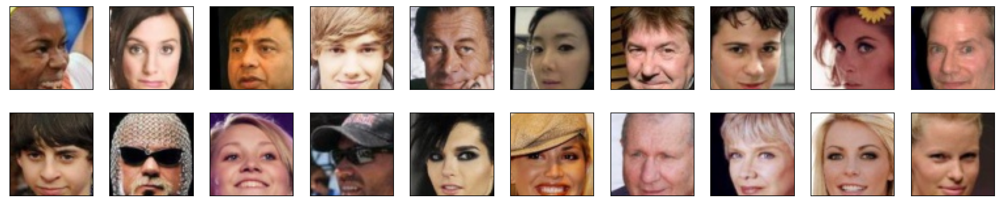

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
from torch.nn import Module
import torch.nn as nn

In [9]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.seq1 = nn.Sequential(
            # bias=False because we are using batchnorms
            #64, 64, 3 input
            nn.Conv2d(3, 128, kernel_size=4, stride=2, padding=1), # 32, 32, 128
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False), # 16, 16, 256
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False), # 8, 8, 512
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2)       
        )
        self.flatten = nn.Flatten()
        self.seq2 = nn.Sequential(
            nn.Linear(8*8*512, 1),
        )
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.seq1(x)
        x = self.flatten(x)
        x = self.seq2(x)
        x = x.view(1,1,1,-1)
#         print(x.shape)
#         print(x)
        return x 

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [11]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.seq = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=1, padding=0, bias=False), # 512, 4, 4
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False), # 256, 8, 8
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False), # 128, 16, 16
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False), # 64, 32, 32
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1), # 3, 64, 64
            nn.Tanh()
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.seq(x)
        return x

In [12]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [13]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    # Hyper params from the DCGAN paper
    g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [14]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    fake_logits = fake_logits.to(device)
    criterion = nn.BCEWithLogitsLoss()
    
    fake_labels = torch.ones(fake_logits.size(-1)) * 0.9
    fake_labels = fake_labels.to(device)
    
    loss = criterion(fake_logits.squeeze(), fake_labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [15]:
# real + fake
# Implementing label smoothing for regularization
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    real_logits = real_logits.to(device)
    fake_logits = fake_logits.to(device)
    criterion = nn.BCEWithLogitsLoss()
    
    real_labels = torch.ones(real_logits.size(-1)) * 0.9
    real_labels = real_labels.to(device)
    
    fake_labels = torch.zeros(fake_logits.size(-1))
    fake_labels = fake_labels.to(device)

    r_loss = criterion(real_logits.squeeze(), real_labels)
    f_loss = criterion(fake_logits.squeeze(), fake_labels)
    loss = r_loss + f_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [16]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [17]:
def generator_step(batch_size: int, latent_dim: int) -> dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    # Generate noise to feed into generator UNIFORM distribution sampling from -1 -> 1
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    z = z.to(device)
    fake_img = generator(z)
    
    # discriminator on fake_img
    d_fake_out = discriminator(fake_img)
    
    # loss on this
    g_loss = generator_loss(d_fake_out)
    
    g_loss.backward()
    g_optimizer.step()
    return {'loss': g_loss}

# discriminator job is to generate the fake image and judge loss
def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    gp = 0
    real_images = real_images.to(device)
    d_optimizer.zero_grad()
    # Generate noise to feed into generator UNIFORM distribution sampling from -1 -> 1
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    z = z.to(device)
    fake_img = generator(z)
    
    # Use discriminator on both real and fake img
    d_real_out = discriminator(real_images)
    d_fake_out = discriminator(fake_img)
    
    # generate loss from both real and fake image
    d_loss = discriminator_loss(d_real_out, d_fake_out)
    
    d_loss.backward()
    d_optimizer.step()
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [18]:
from datetime import datetime

In [19]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
# Check if cuda is available
if torch.cuda.is_available():
  # Set the device to GPU
  device = torch.device("cuda")
else:
  # Set the device to CPU
  device = torch.device("cpu")
    
print(device)

# number of epochs to train your model
n_epochs = 10

# number of images in each batch
batch_size = 64

cuda


In [24]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=0, 
                        drop_last=True,
                        pin_memory=False)

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-10-09 23:07:14 | Epoch [1/10] | Batch 0/509 | d_loss: 1.5825 | g_loss: 3.5942
2023-10-09 23:13:33 | Epoch [1/10] | Batch 50/509 | d_loss: 0.5177 | g_loss: 4.5166
2023-10-09 23:19:47 | Epoch [1/10] | Batch 100/509 | d_loss: 0.5677 | g_loss: 2.9279
2023-10-09 23:26:02 | Epoch [1/10] | Batch 150/509 | d_loss: 0.7884 | g_loss: 2.4922
2023-10-09 23:32:16 | Epoch [1/10] | Batch 200/509 | d_loss: 0.6137 | g_loss: 5.1357
2023-10-09 23:38:31 | Epoch [1/10] | Batch 250/509 | d_loss: 0.4787 | g_loss: 2.7522
2023-10-09 23:44:48 | Epoch [1/10] | Batch 300/509 | d_loss: 0.4965 | g_loss: 3.2567
2023-10-09 23:51:04 | Epoch [1/10] | Batch 350/509 | d_loss: 0.7195 | g_loss: 0.9956
2023-10-09 23:57:19 | Epoch [1/10] | Batch 400/509 | d_loss: 0.6230 | g_loss: 4.3498
2023-10-10 00:03:34 | Epoch [1/10] | Batch 450/509 | d_loss: 0.7124 | g_loss: 4.7730
2023-10-10 00:09:48 | Epoch [1/10] | Batch 500/509 | d_loss: 0.4683 | g_loss: 4.1589


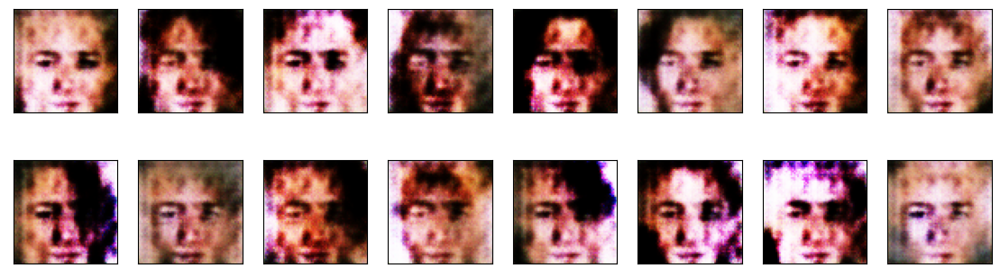

2023-10-10 00:10:58 | Epoch [2/10] | Batch 0/509 | d_loss: 0.4800 | g_loss: 3.5944
2023-10-10 00:17:11 | Epoch [2/10] | Batch 50/509 | d_loss: 0.5190 | g_loss: 3.1779
2023-10-10 00:23:25 | Epoch [2/10] | Batch 100/509 | d_loss: 0.8562 | g_loss: 4.0241
2023-10-10 00:29:38 | Epoch [2/10] | Batch 150/509 | d_loss: 0.4283 | g_loss: 4.6676
2023-10-10 00:35:50 | Epoch [2/10] | Batch 200/509 | d_loss: 0.6182 | g_loss: 3.4041
2023-10-10 00:42:03 | Epoch [2/10] | Batch 250/509 | d_loss: 0.5195 | g_loss: 4.2849
2023-10-10 00:48:16 | Epoch [2/10] | Batch 300/509 | d_loss: 1.4148 | g_loss: 3.1011
2023-10-10 00:54:28 | Epoch [2/10] | Batch 350/509 | d_loss: 0.5004 | g_loss: 2.8780
2023-10-10 01:00:41 | Epoch [2/10] | Batch 400/509 | d_loss: 0.5723 | g_loss: 3.0395
2023-10-10 01:06:54 | Epoch [2/10] | Batch 450/509 | d_loss: 1.3637 | g_loss: 2.9936
2023-10-10 01:13:07 | Epoch [2/10] | Batch 500/509 | d_loss: 0.4890 | g_loss: 4.6094


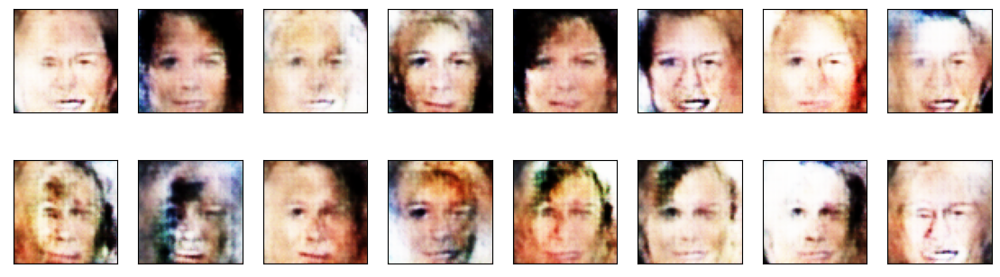

2023-10-10 01:14:15 | Epoch [3/10] | Batch 0/509 | d_loss: 0.7184 | g_loss: 5.8118
2023-10-10 01:20:27 | Epoch [3/10] | Batch 50/509 | d_loss: 0.6394 | g_loss: 2.6448
2023-10-10 01:26:39 | Epoch [3/10] | Batch 100/509 | d_loss: 1.8912 | g_loss: 10.1066
2023-10-10 01:32:52 | Epoch [3/10] | Batch 150/509 | d_loss: 1.9341 | g_loss: 8.0530
2023-10-10 01:39:04 | Epoch [3/10] | Batch 200/509 | d_loss: 0.9664 | g_loss: 1.6973
2023-10-10 01:45:16 | Epoch [3/10] | Batch 250/509 | d_loss: 0.8039 | g_loss: 1.7148
2023-10-10 01:51:27 | Epoch [3/10] | Batch 300/509 | d_loss: 1.0575 | g_loss: 6.3087
2023-10-10 01:57:40 | Epoch [3/10] | Batch 350/509 | d_loss: 0.7747 | g_loss: 4.1200
2023-10-10 02:03:52 | Epoch [3/10] | Batch 400/509 | d_loss: 1.2095 | g_loss: 7.3240
2023-10-10 02:10:05 | Epoch [3/10] | Batch 450/509 | d_loss: 0.4721 | g_loss: 3.0386
2023-10-10 02:16:17 | Epoch [3/10] | Batch 500/509 | d_loss: 1.0482 | g_loss: 6.4204


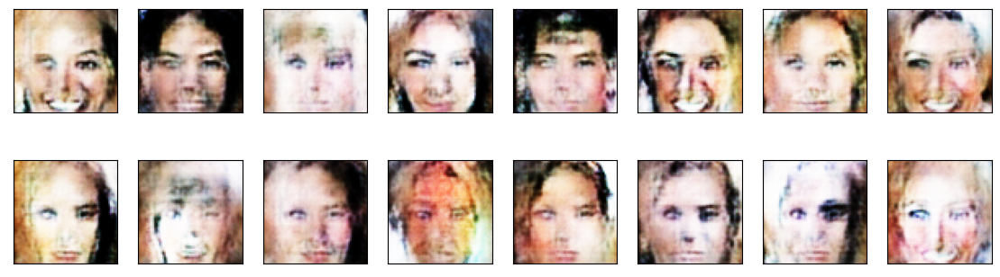

2023-10-10 02:17:24 | Epoch [4/10] | Batch 0/509 | d_loss: 0.6315 | g_loss: 2.2583
2023-10-10 02:23:38 | Epoch [4/10] | Batch 50/509 | d_loss: 0.4479 | g_loss: 2.9040
2023-10-10 02:29:51 | Epoch [4/10] | Batch 100/509 | d_loss: 0.4480 | g_loss: 3.8124
2023-10-10 02:36:05 | Epoch [4/10] | Batch 150/509 | d_loss: 0.6952 | g_loss: 4.6973
2023-10-10 02:42:18 | Epoch [4/10] | Batch 200/509 | d_loss: 0.6285 | g_loss: 3.7473
2023-10-10 02:48:31 | Epoch [4/10] | Batch 250/509 | d_loss: 0.4494 | g_loss: 3.5477
2023-10-10 02:54:45 | Epoch [4/10] | Batch 300/509 | d_loss: 1.3567 | g_loss: 7.8549
2023-10-10 03:00:58 | Epoch [4/10] | Batch 350/509 | d_loss: 1.0744 | g_loss: 7.5026
2023-10-10 03:07:12 | Epoch [4/10] | Batch 400/509 | d_loss: 0.4628 | g_loss: 3.2160
2023-10-10 03:13:25 | Epoch [4/10] | Batch 450/509 | d_loss: 1.4260 | g_loss: 5.3520
2023-10-10 03:19:39 | Epoch [4/10] | Batch 500/509 | d_loss: 0.4631 | g_loss: 3.4381


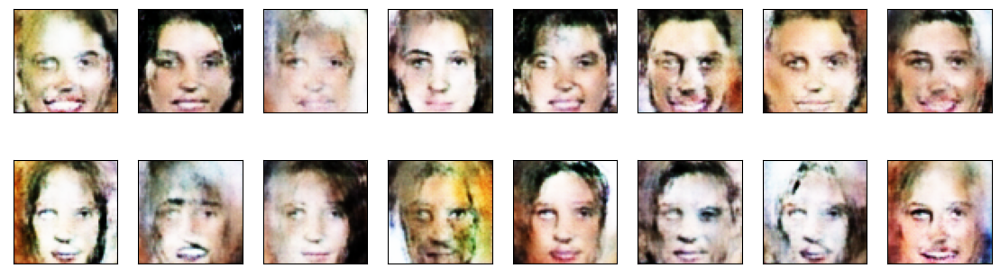

2023-10-10 03:20:47 | Epoch [5/10] | Batch 0/509 | d_loss: 0.4714 | g_loss: 3.0016
2023-10-10 03:27:01 | Epoch [5/10] | Batch 50/509 | d_loss: 0.3969 | g_loss: 3.5487
2023-10-10 03:33:14 | Epoch [5/10] | Batch 100/509 | d_loss: 0.4683 | g_loss: 3.1757
2023-10-10 03:39:28 | Epoch [5/10] | Batch 150/509 | d_loss: 0.4996 | g_loss: 3.0543
2023-10-10 03:45:42 | Epoch [5/10] | Batch 200/509 | d_loss: 0.5835 | g_loss: 2.5708
2023-10-10 03:51:56 | Epoch [5/10] | Batch 250/509 | d_loss: 0.4545 | g_loss: 3.7438
2023-10-10 03:58:02 | Epoch [5/10] | Batch 300/509 | d_loss: 0.5253 | g_loss: 3.4862
2023-10-10 04:04:09 | Epoch [5/10] | Batch 350/509 | d_loss: 0.5419 | g_loss: 3.0972
2023-10-10 04:10:16 | Epoch [5/10] | Batch 400/509 | d_loss: 1.0548 | g_loss: 7.0078
2023-10-10 04:16:23 | Epoch [5/10] | Batch 450/509 | d_loss: 0.4494 | g_loss: 3.6793
2023-10-10 04:22:31 | Epoch [5/10] | Batch 500/509 | d_loss: 0.9027 | g_loss: 6.1815


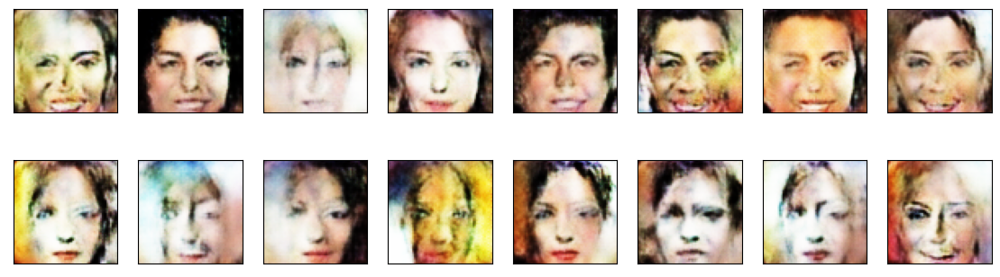

2023-10-10 04:23:38 | Epoch [6/10] | Batch 0/509 | d_loss: 0.5643 | g_loss: 4.6778
2023-10-10 04:29:42 | Epoch [6/10] | Batch 50/509 | d_loss: 0.4249 | g_loss: 4.7519
2023-10-10 04:35:49 | Epoch [6/10] | Batch 100/509 | d_loss: 0.5153 | g_loss: 3.4868
2023-10-10 04:41:55 | Epoch [6/10] | Batch 150/509 | d_loss: 0.4213 | g_loss: 3.2468
2023-10-10 04:48:01 | Epoch [6/10] | Batch 200/509 | d_loss: 0.6734 | g_loss: 2.3813
2023-10-10 04:54:04 | Epoch [6/10] | Batch 250/509 | d_loss: 1.1384 | g_loss: 1.7624
2023-10-10 05:00:08 | Epoch [6/10] | Batch 300/509 | d_loss: 0.6386 | g_loss: 3.5975
2023-10-10 05:06:12 | Epoch [6/10] | Batch 350/509 | d_loss: 0.4536 | g_loss: 3.0779
2023-10-10 05:12:15 | Epoch [6/10] | Batch 400/509 | d_loss: 0.5861 | g_loss: 3.1837
2023-10-10 05:18:20 | Epoch [6/10] | Batch 450/509 | d_loss: 0.4508 | g_loss: 2.4489
2023-10-10 05:24:33 | Epoch [6/10] | Batch 500/509 | d_loss: 1.3781 | g_loss: 2.1353


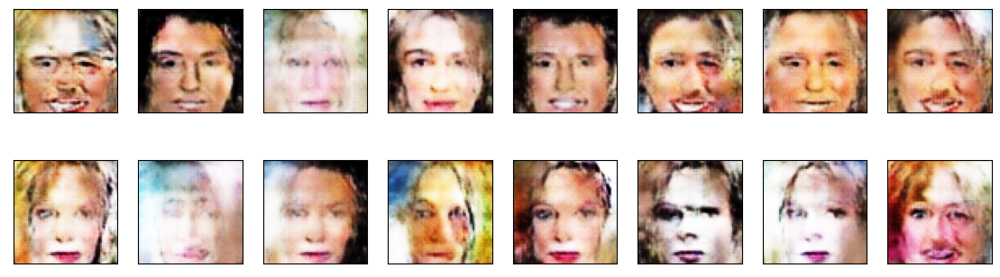

2023-10-10 05:25:42 | Epoch [7/10] | Batch 0/509 | d_loss: 2.3006 | g_loss: 3.9156
2023-10-10 05:31:55 | Epoch [7/10] | Batch 50/509 | d_loss: 0.5561 | g_loss: 4.7889
2023-10-10 05:38:09 | Epoch [7/10] | Batch 100/509 | d_loss: 0.3964 | g_loss: 4.1428
2023-10-10 05:44:22 | Epoch [7/10] | Batch 150/509 | d_loss: 0.6015 | g_loss: 4.6225
2023-10-10 05:50:36 | Epoch [7/10] | Batch 200/509 | d_loss: 0.4142 | g_loss: 5.3107
2023-10-10 05:56:50 | Epoch [7/10] | Batch 250/509 | d_loss: 0.4377 | g_loss: 3.4182
2023-10-10 06:03:03 | Epoch [7/10] | Batch 300/509 | d_loss: 0.4014 | g_loss: 3.6812
2023-10-10 06:09:17 | Epoch [7/10] | Batch 350/509 | d_loss: 0.4217 | g_loss: 4.6738
2023-10-10 06:15:30 | Epoch [7/10] | Batch 400/509 | d_loss: 2.2414 | g_loss: 2.8483
2023-10-10 06:21:44 | Epoch [7/10] | Batch 450/509 | d_loss: 0.4020 | g_loss: 4.4713
2023-10-10 06:27:58 | Epoch [7/10] | Batch 500/509 | d_loss: 0.3888 | g_loss: 4.6403


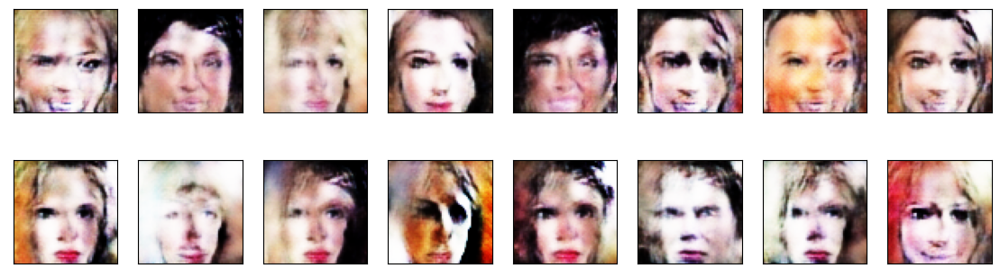

2023-10-10 06:29:06 | Epoch [8/10] | Batch 0/509 | d_loss: 0.4951 | g_loss: 5.0109
2023-10-10 06:35:15 | Epoch [8/10] | Batch 50/509 | d_loss: 0.4261 | g_loss: 3.9647
2023-10-10 06:41:24 | Epoch [8/10] | Batch 100/509 | d_loss: 0.5273 | g_loss: 4.6742
2023-10-10 06:47:33 | Epoch [8/10] | Batch 150/509 | d_loss: 0.7157 | g_loss: 4.9314
2023-10-10 06:53:42 | Epoch [8/10] | Batch 200/509 | d_loss: 0.4076 | g_loss: 3.7556
2023-10-10 06:59:53 | Epoch [8/10] | Batch 250/509 | d_loss: 0.6364 | g_loss: 6.0066
2023-10-10 07:06:03 | Epoch [8/10] | Batch 300/509 | d_loss: 0.4614 | g_loss: 5.2334
2023-10-10 07:12:13 | Epoch [8/10] | Batch 350/509 | d_loss: 0.4037 | g_loss: 4.1809
2023-10-10 07:18:23 | Epoch [8/10] | Batch 400/509 | d_loss: 0.4131 | g_loss: 4.2353
2023-10-10 07:24:33 | Epoch [8/10] | Batch 450/509 | d_loss: 0.4392 | g_loss: 2.8463
2023-10-10 07:30:43 | Epoch [8/10] | Batch 500/509 | d_loss: 0.4629 | g_loss: 3.3569


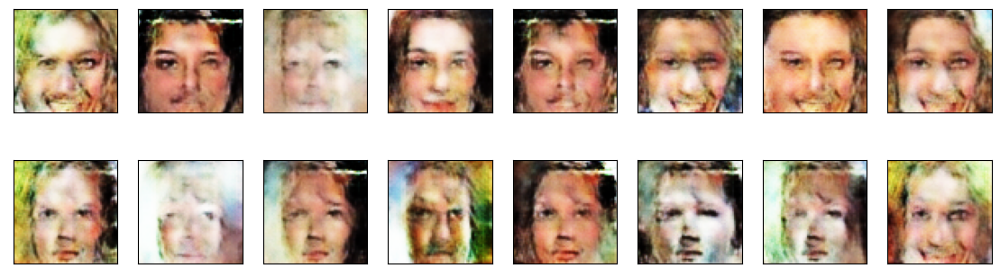

2023-10-10 07:31:50 | Epoch [9/10] | Batch 0/509 | d_loss: 0.4037 | g_loss: 4.6288
2023-10-10 07:37:58 | Epoch [9/10] | Batch 50/509 | d_loss: 0.4722 | g_loss: 4.0281
2023-10-10 07:44:00 | Epoch [9/10] | Batch 100/509 | d_loss: 0.3770 | g_loss: 4.8171
2023-10-10 07:50:02 | Epoch [9/10] | Batch 150/509 | d_loss: 0.4469 | g_loss: 5.0980
2023-10-10 07:56:04 | Epoch [9/10] | Batch 200/509 | d_loss: 0.3790 | g_loss: 4.6911
2023-10-10 08:02:05 | Epoch [9/10] | Batch 250/509 | d_loss: 0.4084 | g_loss: 3.1567
2023-10-10 08:08:10 | Epoch [9/10] | Batch 300/509 | d_loss: 0.3906 | g_loss: 3.7646
2023-10-10 08:14:24 | Epoch [9/10] | Batch 350/509 | d_loss: 0.3840 | g_loss: 3.9816
2023-10-10 08:20:37 | Epoch [9/10] | Batch 400/509 | d_loss: 0.3875 | g_loss: 4.0225
2023-10-10 08:26:51 | Epoch [9/10] | Batch 450/509 | d_loss: 0.4443 | g_loss: 5.1204
2023-10-10 08:33:04 | Epoch [9/10] | Batch 500/509 | d_loss: 0.4560 | g_loss: 2.9974


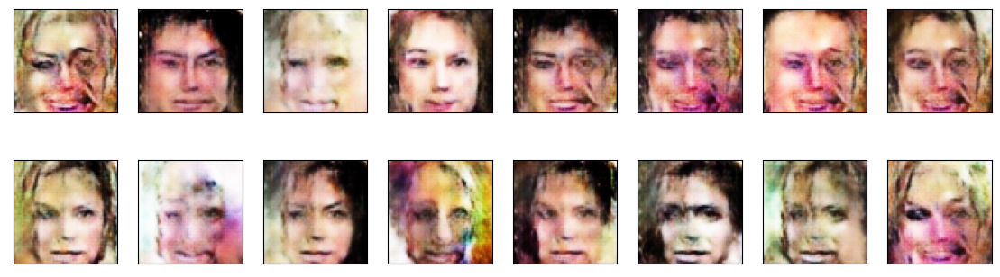

2023-10-10 08:34:12 | Epoch [10/10] | Batch 0/509 | d_loss: 0.4506 | g_loss: 4.7180
2023-10-10 08:40:17 | Epoch [10/10] | Batch 50/509 | d_loss: 0.3921 | g_loss: 4.9450
2023-10-10 08:46:23 | Epoch [10/10] | Batch 100/509 | d_loss: 0.4636 | g_loss: 4.0192
2023-10-10 08:52:29 | Epoch [10/10] | Batch 150/509 | d_loss: 0.6378 | g_loss: 5.8053
2023-10-10 08:58:36 | Epoch [10/10] | Batch 200/509 | d_loss: 0.3834 | g_loss: 3.8292
2023-10-10 09:04:44 | Epoch [10/10] | Batch 250/509 | d_loss: 0.3890 | g_loss: 4.3682
2023-10-10 09:10:51 | Epoch [10/10] | Batch 300/509 | d_loss: 0.7578 | g_loss: 5.6231
2023-10-10 09:17:01 | Epoch [10/10] | Batch 350/509 | d_loss: 0.4296 | g_loss: 4.2425
2023-10-10 09:23:12 | Epoch [10/10] | Batch 400/509 | d_loss: 0.4677 | g_loss: 5.6480
2023-10-10 09:29:21 | Epoch [10/10] | Batch 450/509 | d_loss: 0.3937 | g_loss: 4.7453
2023-10-10 09:35:30 | Epoch [10/10] | Batch 500/509 | d_loss: 0.4068 | g_loss: 5.4302


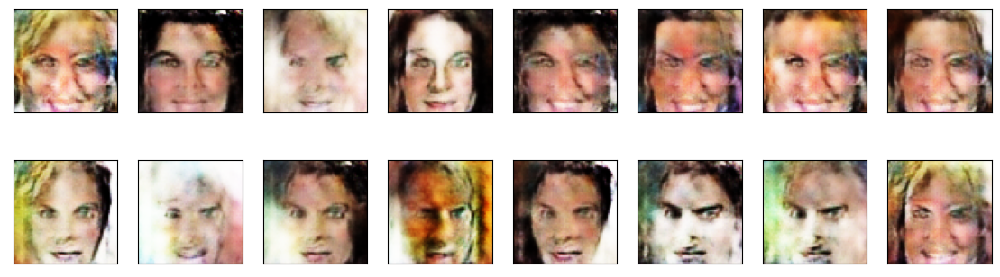

In [26]:

fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []

    
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)

        ####################################

        # TODO: implement the training strategy

        ####################################
        d_loss = discriminator_step(batch_size=batch_size, latent_dim=latent_dim, real_images=real_images)
        g_loss = generator_step(batch_size=batch_size, latent_dim=latent_dim)


        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')

    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

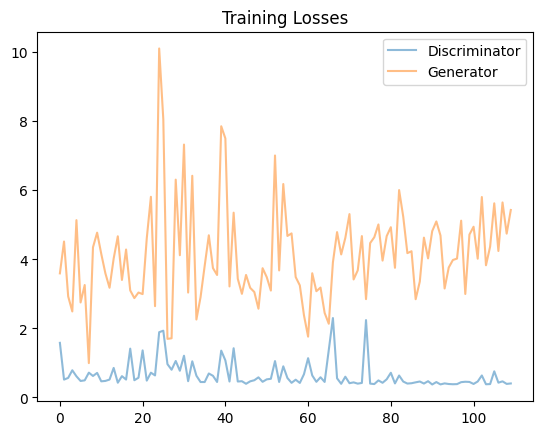

In [27]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** My DCGAN model was able to accurately create the jaw features and create decent face shapes. It lacks in the details when creating primary facial features (eyes, mouth, nose, skin, etc. ).

Looking through the dataset, the celebrities had unbalanced distributions of "props" (hats, glasses, etc.) this made it so the GAN was not outputting any images with props. If it did, it majorly messed up the hair or eye area which I suspect is what's wrong with my outputted images.

My DCGAN has lower number of layers along with up and down sampling. Supposedly my model wasn't able to capture as many features from celebrity faces to accurately get a great representation of features.

The last thing I could've done is train for longer epochs. I learned that training a GAN takes considerable more time than other architectures due to the training of two different models. I might as improve by changing model architectures by straying away from DCGAN and trying other architectures laid out on research papers.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.